<div class="alert alert-block alert-info">
<center> <h1> DATA MINING PROJECT </h1> </center> <br>
<center>2020/2021</center>

**GRUPO O** </br>
CAROLINA SÁ, 20210693 </br>
GONÇALO LOPES, 20210679 </br>
MARIANA ROMÃO, 20210688 </br>

**Table of Contents** <br>
* [1.Import Libraries](#importlibraries)
* [2. Initial Analysis](#initialanalysis)
* [3. Data Pre-Processing](#datapreprocessing)
    * [3.1 Filling missing values & Checking coeherences](#fillemptycells)
    * [3.2. Transforming Non-Metric to Metric Features](#transformMetric)
    * [3.3. Analyzing Correlation](#analyzeCorr)
* [4. Outliers](#outliers)
    * [4.1. IQR](#iqr)
    * [4.2. Z-Score](#zscore)
    * [4.3. LOF](#lof)
    * [4.4. DBSCAN](#dbscan)
* [5. Data Normalization](#normalization)
    * [5.1. MinMax Scaler](#minmax)
    * [5.2. Standard Scaler](#standard)
    * [5.3. Robust Scaler](#robust)
* [6. Clustering](#clustering)
    * [6.1. Inertia & Silhouette](#inertiaSilhouette)
    * [6.2. Hierarchical Clustering](#hierarchical)
    * [6.3. K-Means Clustering](#kmeans)
    * [6.4. Self-Organized Maps](#selforganized)
        * [6.4.1. Hierarchical Clustering with Self-Organized Maps](#hcsom)
        * [6.4.2. K-Means with Self-Organized Maps](#ksom)   
    * [6.5. DBSCAN](#dbscan2)
    * [6.6. GMM](#gmm)
    * [6.7. Mean Shift Clustering](#msc)
    * [6.8. Clustering by Perspective](#clusterPersp)
* [7. Cluster Analysis](#clusterAnalysis)
* [8. Classification of Outliers](#classificationOutlier)    

<hr>
<a class="anchor" id="importlibraries">
    
# 1. Import libraries
    
</a>

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy import stats
from math import ceil
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.cluster import KMeans
from sklearn.preprocessing import RobustScaler
from collections import Counter
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.feature_selection import RFE


import warnings
warnings.filterwarnings('ignore')

<hr>
<a class="anchor" id="initialanalysis">
    
# 2. Initial Analysis
    
</a>

First, we need to read the given data and see some basic aspects about it.

In [2]:
df = pd.read_sas('a2z_insurance.sas7bdat')

In [3]:
df.duplicated().value_counts()

False    10296
dtype: int64

Set the CustID as the dataframe index

In [4]:
df = df.set_index('CustID')

Some of the variables can have a most correct type, like for example, Birthday being a integer instead of float.

In [5]:
df

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
1.0,1985.0,1982.0,b'2 - High School',2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
2.0,1981.0,1995.0,b'2 - High School',677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
3.0,1991.0,1970.0,b'1 - Basic',2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
4.0,1990.0,1981.0,b'3 - BSc/MSc',1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
5.0,1986.0,1973.0,b'3 - BSc/MSc',1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10292.0,1984.0,1949.0,b'4 - PhD',3188.0,2.0,0.0,-0.11,0.96,393.74,49.45,173.81,9.78,14.78
10293.0,1977.0,1952.0,b'1 - Basic',2431.0,3.0,0.0,1405.60,0.00,133.58,1035.75,143.25,12.89,105.13
10294.0,1994.0,1976.0,b'3 - BSc/MSc',2918.0,1.0,1.0,524.10,0.21,403.63,132.80,142.25,12.67,4.89


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 10296 entries, 1.0 to 10296.0
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   FirstPolYear   10266 non-null  float64
 1   BirthYear      10279 non-null  float64
 2   EducDeg        10279 non-null  object 
 3   MonthSal       10260 non-null  float64
 4   GeoLivArea     10295 non-null  float64
 5   Children       10275 non-null  float64
 6   CustMonVal     10296 non-null  float64
 7   ClaimsRate     10296 non-null  float64
 8   PremMotor      10262 non-null  float64
 9   PremHousehold  10296 non-null  float64
 10  PremHealth     10253 non-null  float64
 11  PremLife       10192 non-null  float64
 12  PremWork       10210 non-null  float64
dtypes: float64(12), object(1)
memory usage: 1.1+ MB


In [7]:
df.shape

(10296, 13)

We noted in the df.info that some variables do not have 10296 records. Let's see the NaN values:

In [8]:
df.isnull().sum()

FirstPolYear      30
BirthYear         17
EducDeg           17
MonthSal          36
GeoLivArea         1
Children          21
CustMonVal         0
ClaimsRate         0
PremMotor         34
PremHousehold      0
PremHealth        43
PremLife         104
PremWork          86
dtype: int64

<hr>
<a class="anchor" id="datapreprocessing">
    
# 3. Data Pre-Processing
    
</a>

In [9]:
metric_features=['FirstPolYear', 'BirthYear',
  'MonthSal',
 'CustMonVal',
 'ClaimsRate',
 'PremMotor',
 'PremHousehold',
 'PremHealth',
 'PremLife',
 'PremWork']

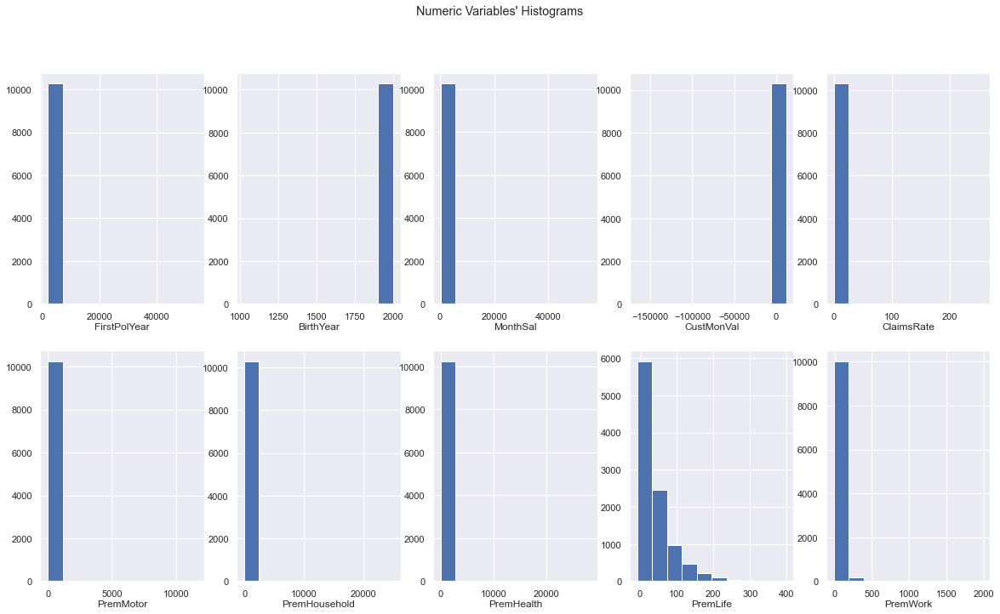

In [10]:
sns.set()

fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

for ax, feat in zip(axes.flatten(), metric_features):
    ax.hist(df[feat])
    ax.set_title(feat, y=-0.13)

title = "Numeric Variables' Histograms"

plt.suptitle(title)

plt.show()

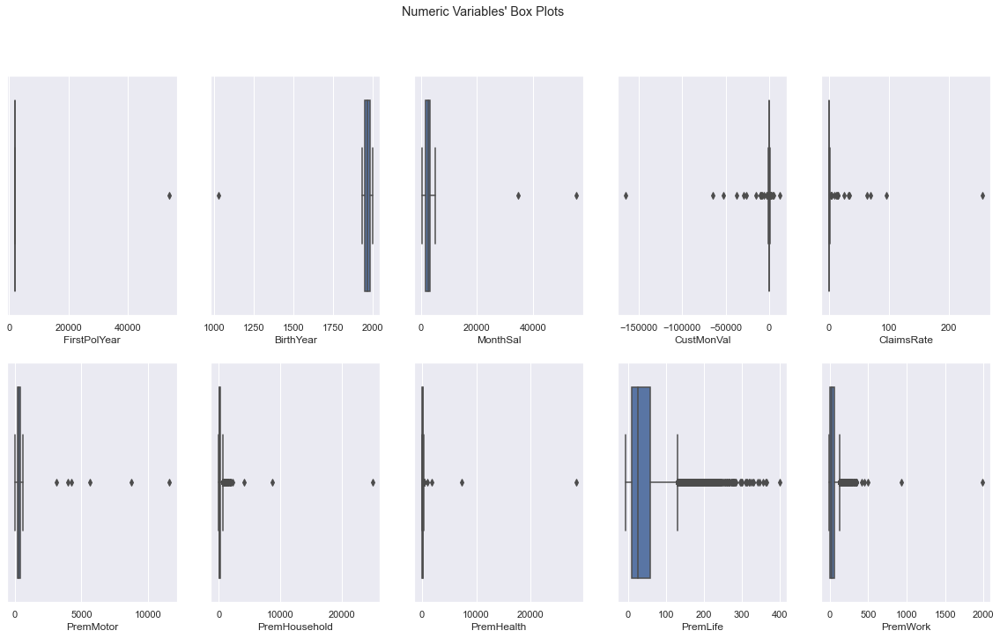

In [11]:
sns.set()

fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=df[feat], ax=ax)
   
title = "Numeric Variables' Box Plots"

plt.suptitle(title)

plt.show()

<hr>
<a class="anchor" id="fillemptycells">
    
## 3.1 Filling missing values & Checking Coeherence
    
</a>

After studying the database, we found out that are some values that cannot be possible, for example, a costumer born at 1028, or the BirthYear is higher than the FirstPolYear (the costumer can't be a costumer without even being born).

In [12]:
df[df['BirthYear'] < 1916]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
7196.0,1993.0,1028.0,b'3 - BSc/MSc',2830.0,4.0,0.0,146.02,0.77,428.97,192.8,108.91,1.89,23.67


We will set the value to NaN, in order to calculate the mean and fill the Birth Year with a more accurate value.

In [13]:
df.loc[7196, ['BirthYear']] = np.nan
df.loc[7196]

FirstPolYear             1993.0
BirthYear                   NaN
EducDeg          b'3 - BSc/MSc'
MonthSal                 2830.0
GeoLivArea                  4.0
Children                    0.0
CustMonVal               146.02
ClaimsRate                 0.77
PremMotor                428.97
PremHousehold             192.8
PremHealth               108.91
PremLife                   1.89
PremWork                  23.67
Name: 7196.0, dtype: object

Check if there are customers that began to be our client after 2016 (it is not possible because the dataset is referent to 2016).

In [14]:
df[df['FirstPolYear'] > 2016]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
9295.0,53784.0,1948.0,b'3 - BSc/MSc',3268.0,1.0,0.0,348.85,0.37,351.4,15.0,187.37,22.45,17.78


In [15]:
df.loc[9295, ['FirstPolYear']] = np.nan
df.loc[9295]

FirstPolYear                NaN
BirthYear                1948.0
EducDeg          b'3 - BSc/MSc'
MonthSal                 3268.0
GeoLivArea                  1.0
Children                    0.0
CustMonVal               348.85
ClaimsRate                 0.37
PremMotor                 351.4
PremHousehold              15.0
PremHealth               187.37
PremLife                  22.45
PremWork                  17.78
Name: 9295.0, dtype: object

Let's start out with the <b>fillna()</b> method. It fills the NA-marked values with values you supply the method with. <br>
Now, if , for example, a salary is missing from a person's rows, a mean can be used to fill that value. This way, we're not dropping these people from the dataset, and we're also not skewing the salary values. <br>

In [16]:
toFill = ['MonthSal', 'BirthYear',
          'CustMonVal', 'ClaimsRate', 
          'PremMotor', 'PremHousehold',
         'PremHealth', 'PremLife', 'PremWork']

for col in toFill:
    df[col].fillna(int(df[col].median()), inplace=True)

In [17]:
#To check if the missing values are actually gone.
df.isnull().any()

FirstPolYear      True
BirthYear        False
EducDeg           True
MonthSal         False
GeoLivArea        True
Children          True
CustMonVal       False
ClaimsRate       False
PremMotor        False
PremHousehold    False
PremHealth       False
PremLife         False
PremWork         False
dtype: bool

GeoLivArea should be filled with the mode (moda), because it's a categorical variable with area codes.

In [18]:
df['GeoLivArea'].fillna(int(df['GeoLivArea'].mode()), inplace=True)
df['Children'].fillna(int(df['Children'].mode()), inplace=True)
df['EducDeg'].fillna(df['EducDeg'].mode(), inplace=True)

In [19]:
df.isnull().sum()

FirstPolYear     31
BirthYear         0
EducDeg          17
MonthSal          0
GeoLivArea        0
Children          0
CustMonVal        0
ClaimsRate        0
PremMotor         0
PremHousehold     0
PremHealth        0
PremLife          0
PremWork          0
dtype: int64

We also have another problem: there are a huge ammount of cells in our dataframe in wich the First Policy year is lower than the Birth Year, wich cannot be possible. Let's see them:

In [20]:
df[df['FirstPolYear'] < df['BirthYear']]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
2.0,1981.0,1995.0,b'2 - High School',677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
14.0,1983.0,2000.0,b'1 - Basic',1043.0,3.0,1.0,-75.12,1.06,44.34,342.85,127.69,267.94,94.46
19.0,1981.0,1982.0,b'1 - Basic',1414.0,3.0,1.0,230.38,0.71,313.17,373.40,121.80,14.78,72.57
23.0,1976.0,1986.0,b'2 - High School',1495.0,1.0,1.0,-89.79,1.08,209.04,308.95,192.48,64.79,54.90
41.0,1994.0,1995.0,b'2 - High School',1177.0,4.0,1.0,121.36,0.84,52.01,455.65,135.47,146.36,148.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10269.0,1987.0,1988.0,b'3 - BSc/MSc',1414.0,3.0,1.0,50.46,0.90,129.58,167.80,184.48,165.92,75.46
10274.0,1989.0,1992.0,b'2 - High School',1035.0,1.0,1.0,293.51,0.58,235.71,195.60,103.13,170.92,58.12
10285.0,1980.0,1987.0,b'3 - BSc/MSc',1504.0,4.0,1.0,-1.55,0.96,390.63,29.45,179.70,-6.00,25.00


As we can see, there are 1997 cases that are just impossible to happen. With that said, and after studying different solutions and options to overcome this obstacle, we decided that the values in the First Policy Year are going to be set to NaN, in order to fill them with the mean difference between the year that a costumer was born and the First Policy Year. For example, if <b>mean('BirthYear' - 'FirstPolYear') = 22</b>, then all the missing values in 'FirstPolYear' are going to be calculated with <b>'BirthYear' + 22</b>.

In [21]:
df.loc[df['FirstPolYear'] < df['BirthYear'], ['FirstPolYear']] = None

In [22]:
#Check if the values actually updated to NaN, for example, CustID=2
df.loc[2]

FirstPolYear                    NaN
BirthYear                    1995.0
EducDeg          b'2 - High School'
MonthSal                      677.0
GeoLivArea                      4.0
Children                        1.0
CustMonVal                  -131.13
ClaimsRate                     1.12
PremMotor                     77.46
PremHousehold                 416.2
PremHealth                   116.69
PremLife                     194.48
PremWork                     106.13
Name: 2.0, dtype: object

In [23]:
print(int(df['FirstPolYear'].mean()))
print(int(df['BirthYear'].mean()))

1986
1968


In [24]:
1986-1968

18

So, the average person do a insurance after 18 years of being born. With that said, we are going to fill the NaN values with the <b>Birth Year + 18</b>, as said before.

In [25]:
df['FirstPolYear'].fillna(df['BirthYear'] + 18, inplace=True)

With this calculation, there will be rows that have a 'FirstPolYear' higher than 2016. That cannot happen due to the fact that the current year of the database is 2016.

In [26]:
df.loc[df['FirstPolYear']>2016, 'FirstPolYear'] = 2016

In [27]:
df.isnull().sum()

FirstPolYear      0
BirthYear         0
EducDeg          17
MonthSal          0
GeoLivArea        0
Children          0
CustMonVal        0
ClaimsRate        0
PremMotor         0
PremHousehold     0
PremHealth        0
PremLife          0
PremWork          0
dtype: int64

So we got rid of the missing values on almost every column of our database.
The remaining column that need to be treated is 'EducDeg'.

We find odd that a person with 18 years old already has a degree (b'3 - BSc/MSc' or b'4 - PhD) so this will be checked.

In [28]:
df.loc[((2016-df['BirthYear'].astype(int))<=18) & ((df['EducDeg'].astype(str) == "b'3 - BSc/MSc'") | (df['EducDeg'].astype(str) == "b'4 - PhD'"))]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,


We find odd that a person with less than 16 years old already has a monthly salary due the fact that in Portugal is not possible to work with less than 16 years. 

In [29]:
df = df[df['MonthSal'] > 0]

In [30]:
#df.loc[((2016-df['BirthYear'].astype(int))<16) & (df['MonthSal'].astype(int) != 0), 'MonthSal'] = 0

We think that someone younger than 12 years old normaly isn't a parent so isn't possible to have children

In [31]:
df.loc[((2016-df['BirthYear'].astype(int))<=12) & (df['Children'].astype(int) == 1)]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,


In [34]:
df['TotalPrem'] = abs(df['PremMotor']) + abs(df['PremHousehold']) + abs(df['PremHealth']) + abs(df['PremLife']) + abs(df['PremWork'])

In [35]:
df

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem
CustID,,,,,,,,,,,,,,
1.0,1985.0,1982.0,b'2 - High School',2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89,665.56
2.0,2013.0,1995.0,b'2 - High School',677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13,910.96
3.0,1991.0,1970.0,b'1 - Basic',2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02,740.60
4.0,1990.0,1981.0,b'3 - BSc/MSc',1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34,600.68
5.0,1986.0,1973.0,b'3 - BSc/MSc',1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45,629.24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10292.0,1984.0,1949.0,b'4 - PhD',3188.0,2.0,0.0,-0.11,0.96,393.74,49.45,173.81,9.78,14.78,641.56
10293.0,1977.0,1952.0,b'1 - Basic',2431.0,3.0,0.0,1405.60,0.00,133.58,1035.75,143.25,12.89,105.13,1430.60
10294.0,1994.0,1976.0,b'3 - BSc/MSc',2918.0,1.0,1.0,524.10,0.21,403.63,132.80,142.25,12.67,4.89,696.24


Now we will create a column with the % of money spent in premiums in relation with the monthly salary.

In [36]:
df['%TotalPrem'] = round((100*df['TotalPrem']) / (df['MonthSal']*12),1)

In [37]:
df

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,%TotalPrem
CustID,,,,,,,,,,,,,,,
1.0,1985.0,1982.0,b'2 - High School',2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89,665.56,2.5
2.0,2013.0,1995.0,b'2 - High School',677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13,910.96,11.2
3.0,1991.0,1970.0,b'1 - Basic',2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02,740.60,2.7
4.0,1990.0,1981.0,b'3 - BSc/MSc',1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34,600.68,4.6
5.0,1986.0,1973.0,b'3 - BSc/MSc',1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45,629.24,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10292.0,1984.0,1949.0,b'4 - PhD',3188.0,2.0,0.0,-0.11,0.96,393.74,49.45,173.81,9.78,14.78,641.56,1.7
10293.0,1977.0,1952.0,b'1 - Basic',2431.0,3.0,0.0,1405.60,0.00,133.58,1035.75,143.25,12.89,105.13,1430.60,4.9
10294.0,1994.0,1976.0,b'3 - BSc/MSc',2918.0,1.0,1.0,524.10,0.21,403.63,132.80,142.25,12.67,4.89,696.24,2.0


Now we will create columns with the % of money spent in each premium in relation with the money spent on premiumns anually

In [38]:
df['%PremMotor'] = round((100 * df['PremMotor'])/ df['TotalPrem'],1)
df['%PremHousehold'] = round((100 * df['PremHousehold'])/ df['TotalPrem'],1)
df['%PremHealth'] = round((100 * df['PremHealth'])/  df['TotalPrem'],1)
df['%PremLife'] = round((100 * df['PremLife'])/  df['TotalPrem'],1)
df['%PremWork'] = round((100 * df['PremWork'])/  df['TotalPrem'],1)

<hr>
<a class="anchor" id="transformMetric">
    
## 3.2 Transform Non-Metric features to Metric features
    
</a>

In [39]:
df = pd.get_dummies(df, columns=['EducDeg','GeoLivArea'])

In [40]:
df

,FirstPolYear,BirthYear,MonthSal,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,...,%PremLife,%PremWork,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD',GeoLivArea_1.0,GeoLivArea_2.0,GeoLivArea_3.0,GeoLivArea_4.0
CustID,,,,,,,,,,,,,,,,,,,,,
1.0,1985.0,1982.0,2177.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,...,7.1,2.5,0,1,0,0,1,0,0,0
2.0,2013.0,1995.0,677.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,...,21.3,11.7,0,1,0,0,0,0,0,1
3.0,1991.0,1970.0,2277.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,...,11.7,13.4,1,0,0,0,0,0,1,0
4.0,1990.0,1981.0,1099.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,...,5.9,4.7,0,0,1,0,0,0,0,1
5.0,1986.0,1973.0,1763.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,...,3.0,6.6,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10292.0,1984.0,1949.0,3188.0,0.0,-0.11,0.96,393.74,49.45,173.81,9.78,...,1.5,2.3,0,0,0,1,0,1,0,0
10293.0,1977.0,1952.0,2431.0,0.0,1405.60,0.00,133.58,1035.75,143.25,12.89,...,0.9,7.3,1,0,0,0,0,0,1,0
10294.0,1994.0,1976.0,2918.0,1.0,524.10,0.21,403.63,132.80,142.25,12.67,...,1.8,0.7,0,0,1,0,1,0,0,0


<hr>
<a class="anchor" id="analyzeCorr">
    
## 3.3 Analyzing Correlation
    
</a>

In [41]:
def cor_heatmap(cor):
    mask = np.triu(np.ones_like(cor, dtype=bool))
    plt.figure(figsize=(30,30))
    sns.heatmap(data = cor, mask=mask, annot = True, cmap=sns.diverging_palette(220, 10, as_cmap=True), fmt='.1')
    plt.show()

In [42]:
cor_spearman = df.corr(method ='spearman')

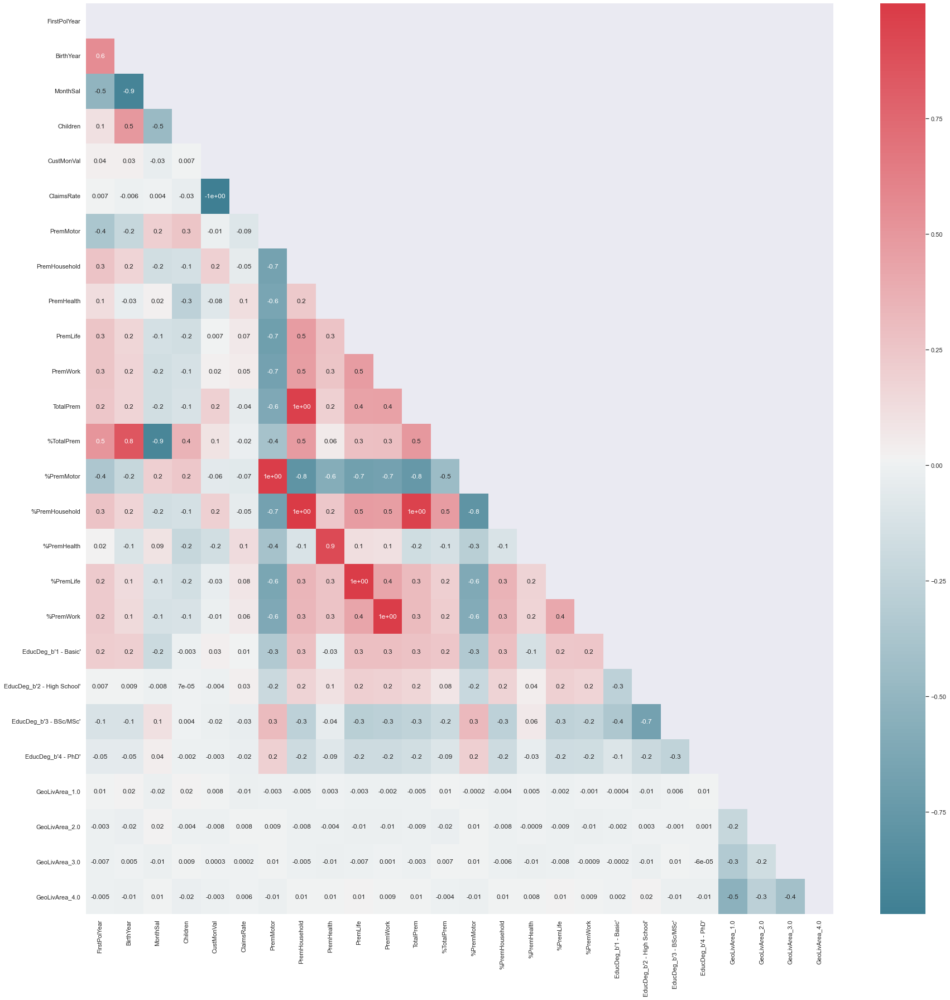

In [44]:
cor_heatmap(cor_spearman)

Due to the fact that we don't have further information about the meaning of the codes in the GeoLivArea, and the variable's correlation is almost null with the other variables, we will drop i. <br>
As it's possible to see in the heatmap above the ClaimsRate and CustMontVal are highly correlated so we made the decision to discard one colunm because the information that one column gives is almost the same as the other. Since CustMontVal has a more meanfuly meaning to the project goal we have chosen to drop the column ClaimsRate.<br> <br>

<font color='black'>As it's possible to analyse in the heatmap, the 'ClaimsRate' and 'CustMonVal' are highly correlated with each other, but do not have any type of conection between the others features. Due to that fact, we decided to drop both columns.</font>

In [46]:
df = df.drop(columns=['GeoLivArea_1.0', 'GeoLivArea_2.0', 'GeoLivArea_3.0', 'GeoLivArea_4.0'], axis=1)
df = df.drop('ClaimsRate', axis=1)

In [47]:
df = df.drop('CustMonVal', axis=1)

Redifining the metric-features:

In [48]:
metric_features=['FirstPolYear', 'BirthYear',
  'MonthSal',
 'PremMotor',
 'PremHousehold',
 'PremHealth',
 'PremLife',
 'PremWork',
'TotalPrem',
'%TotalPrem',
'%PremMotor',
'%PremHousehold',
'%PremHealth',
'%PremLife',
'%PremWork']

<hr>
<a class="anchor" id="outliers">
    
# 4. Outliers
    
</a>

Again, we're going to check the boxplots of the features, in order to visualize the outliers and remove then.

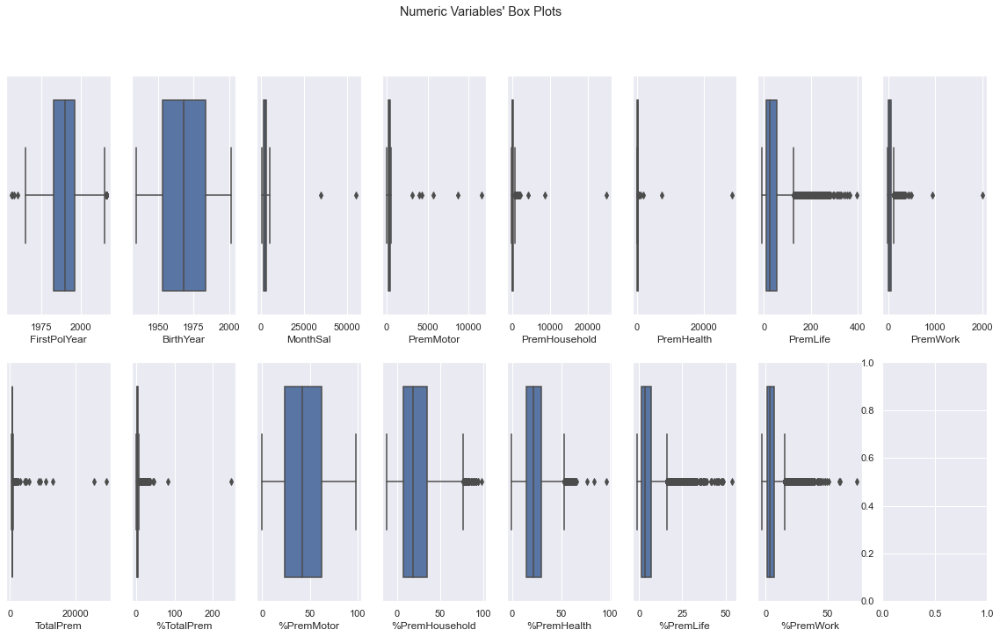

In [49]:
sns.set()

fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=df[feat], ax=ax)
   
title = "Numeric Variables' Box Plots"

plt.suptitle(title)

plt.show()

<hr>
<a class="anchor" id="iqr">
    
## 4.1 Interquartile Range (IQR)
    
</a>

In [50]:
outliers=['FirstPolYear', 'BirthYear', 'MonthSal',
          'PremMotor', 'PremHousehold', 'PremHealth', 'PremLife', 'PremWork']

q25 = df.quantile(.25)
q75 = df.quantile(.75)
iqr = (q75 - q25)

upper_lim = q75 + 5 * iqr
lower_lim = q25 - 5 * iqr

filters = []
for outlier in metric_features:
    llim = lower_lim[outlier]
    ulim = upper_lim[outlier]
    filters.append(df[outlier].between(llim, ulim, inclusive=True))

df_quantile = df[np.all(filters, 0)]

In [51]:
df_outliers = df[~np.all(filters, 0)]   #df with only the outliers

In [52]:
100 - (int(df_quantile.shape[0])*100/int(df.shape[0]))

2.7097902097902136

In [53]:
df_box = df.copy()
df_box = df_box.loc[df_box['MonthSal'].astype(int) < 20000]

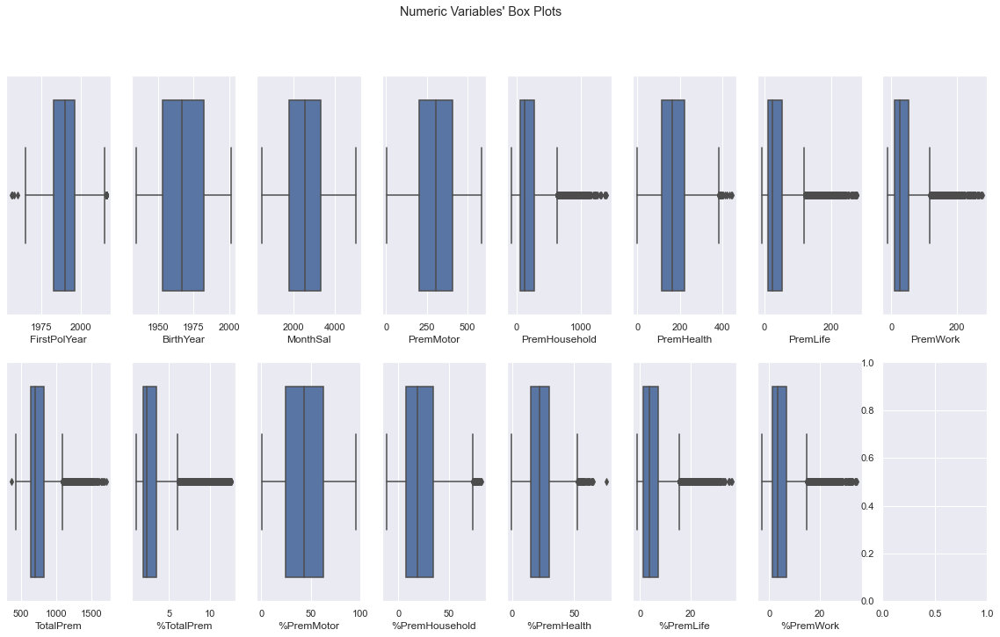

In [54]:
sns.set()

fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=df_quantile[feat], ax=ax)
   
title = "Numeric Variables' Box Plots"

plt.suptitle(title)

plt.show()

<hr>
<a class="anchor" id="zscore">
    
## 4.2 Z-Score
    
</a>

In [55]:
z_scores = stats.zscore(df[metric_features],axis=1)
abs_z_scores = np.abs(z_scores)
filtered_entries = (abs_z_scores < 1.96).all(axis=1)
df_z = df[filtered_entries]

In [56]:
(int(df_z.shape[0])*100/int(df.shape[0]))

2.8554778554778553

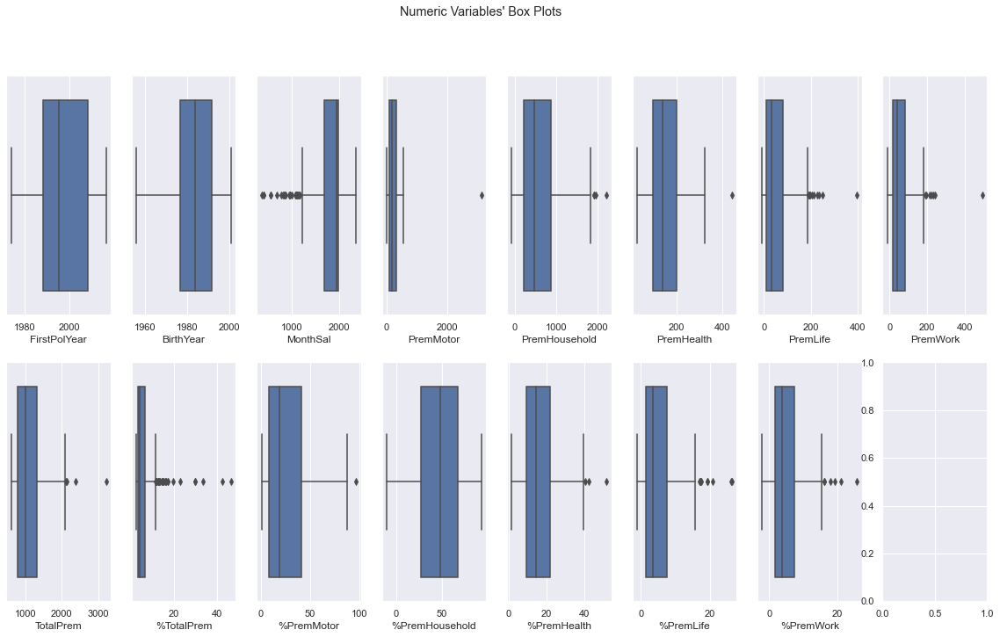

In [57]:
sns.set()

fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=df_z[feat], ax=ax)
   
title = "Numeric Variables' Box Plots"

plt.suptitle(title)

plt.show()

<hr>
<a class="anchor" id="lof">
    
## 4.3 LOF
    
</a> <br>

In [58]:
from sklearn.neighbors import LocalOutlierFactor

In [59]:
df_lof = df.copy()

In [60]:
# Consider 50 neighbors 
lof = LocalOutlierFactor(n_neighbors=50)

In [61]:
lof_pred=lof.fit_predict(df_lof[metric_features])

In [62]:
outlier_index = df_lof[lof_pred == -1] # negative values are outliers
outlier_index

,FirstPolYear,BirthYear,MonthSal,Children,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,%TotalPrem,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD'
CustID,,,,,,,,,,,,,,,,,,,,
146.0,2004.0,1986.0,2554.0,1.0,144.36,-11.10,381.85,47.23,12.78,597.32,1.9,24.2,-1.9,63.9,7.9,2.1,1,0,0,0
150.0,2012.0,1994.0,984.0,1.0,64.90,197.25,29.56,18.56,451.53,761.80,6.5,8.5,25.9,3.9,2.4,59.3,1,0,0,0
525.0,1986.0,1939.0,4056.0,0.0,64.68,13.35,440.86,28.56,30.23,577.68,1.2,11.2,2.3,76.3,4.9,5.2,0,0,1,0
559.0,1986.0,1971.0,2331.0,0.0,276.72,136.70,50.90,199.37,11.67,675.36,2.4,41.0,20.2,7.5,29.5,1.7,0,0,1,0
1070.0,2016.0,1998.0,566.0,1.0,14.56,1777.55,49.23,46.01,121.69,2009.04,29.6,0.7,88.5,2.5,2.3,6.1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9813.0,1977.0,1975.0,1780.0,0.0,190.37,-1.10,90.35,261.05,39.45,582.32,2.7,32.7,-0.2,15.5,44.8,6.8,0,0,1,0
9948.0,2016.0,2000.0,422.0,1.0,36.23,1409.15,66.68,14.78,171.59,1698.43,33.5,2.1,83.0,3.9,0.9,10.1,1,0,0,0
10117.0,2006.0,1988.0,1958.0,1.0,163.03,-75.00,177.59,48.23,191.26,655.11,2.8,24.9,-11.4,27.1,7.4,29.2,0,1,0,0


In [63]:
df_lof = df_lof[lof_pred != -1]

In [64]:
(outlier_index.shape[0] / df.shape[0])*100

0.8644133644133644

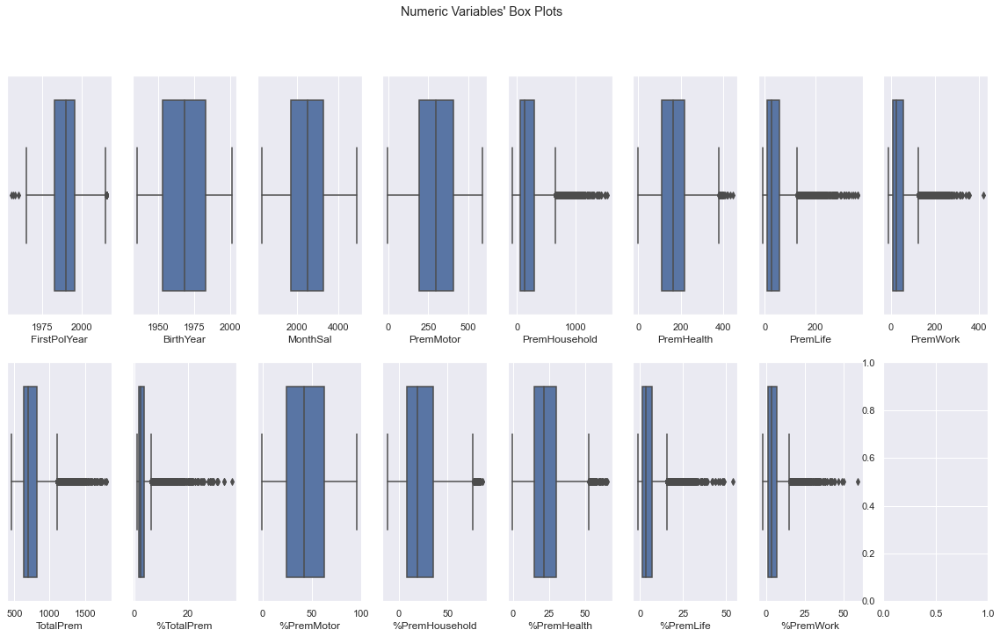

In [65]:
sns.set()

fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=df_lof[feat], ax=ax)
   
title = "Numeric Variables' Box Plots"

plt.suptitle(title)

plt.show()

<hr>
<a class="anchor" id="dbscan">
    
## 4.4 DBSCAN
    
</a> <br>


In [66]:
df_dbscan = df.copy()
df_dbscan = StandardScaler().fit_transform(df_dbscan)
clustering = DBSCAN(eps=3, min_samples=2).fit(df_dbscan)
core_samples_mask = np.zeros_like(clustering.labels_, dtype=bool)
core_samples_mask[clustering.core_sample_indices_] = True
labels = clustering.labels_

n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)


print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(df_dbscan, labels))

Estimated number of clusters: 6
Estimated number of noise points: 33
Silhouette Coefficient: 0.195


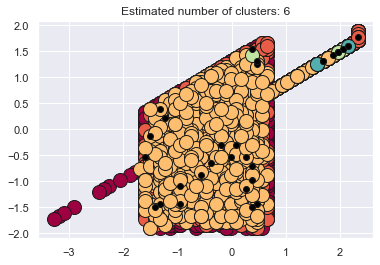

In [67]:
unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = labels == k

    xy = df_dbscan[class_member_mask & core_samples_mask]
    plt.plot(
        xy[:, 0],
        xy[:, 1],
        "o",
        markerfacecolor=tuple(col),
        markeredgecolor="k",
        markersize=14,
    )

    xy = df_dbscan[class_member_mask & ~core_samples_mask]
    plt.plot(
        xy[:, 0],
        xy[:, 1],
        "o",
        markerfacecolor=tuple(col),
        markeredgecolor="k",
        markersize=6,
    )

plt.title("Estimated number of clusters: %d" % n_clusters_)
plt.show()

<hr>
<a class="anchor" id="normalization">
    
# 5. Data Normalization
    
</a>

In [68]:
df = df_quantile

<hr>
<a class="anchor" id="minmax">
    
## 5.1. MinMax Scaler
    
</a> <br>

In [69]:
df_minmax = df.copy()

In [70]:
# Use MinMaxScaler to scale the data
scalerM = MinMaxScaler()
scaled_featM = scalerM.fit_transform(df_minmax[metric_features])
df_minmax[metric_features] = scaled_featM
df_minmax.head()

,FirstPolYear,BirthYear,MonthSal,Children,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,%TotalPrem,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD'
CustID,,,,,,,,,,,,,,,,,,,,
1.0,0.483333,0.712121,0.379852,1.0,0.639911,0.105168,0.333663,0.188958,0.099641,0.230595,0.129310,0.589099,0.250797,0.291123,0.221925,0.138298,0,1,0,0
2.0,0.950000,0.909091,0.052769,1.0,0.126720,0.334468,0.266984,0.704895,0.407429,0.412614,0.879310,0.085954,0.609989,0.171018,0.601604,0.382979,0,1,0,0
3.0,0.583333,0.530303,0.401657,0.0,0.348050,0.203936,0.284716,0.326593,0.382907,0.286254,0.146552,0.288260,0.446334,0.223238,0.344920,0.428191,1,0,0,0
4.0,0.566667,0.696970,0.144788,1.0,0.307340,0.080587,0.704047,0.148130,0.139132,0.182472,0.310345,0.315514,0.200850,0.680157,0.189840,0.196809,0,0,1,0
5.0,0.500000,0.575758,0.289577,1.0,0.575881,0.083617,0.415084,0.090193,0.184348,0.203655,0.172414,0.560797,0.205101,0.382507,0.112299,0.247340,0,0,1,0


In [71]:
df_minmax[metric_features].describe().round(2)

,FirstPolYear,BirthYear,MonthSal,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,%TotalPrem,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork
count,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00
mean,0.58,0.49,0.46,0.51,0.18,0.38,0.16,0.17,0.29,0.18,0.46,0.36,0.30,0.17,0.20
std,0.17,0.26,0.21,0.23,0.15,0.17,0.15,0.15,0.12,0.17,0.24,0.20,0.14,0.14,0.14
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.45,0.27,0.29,0.34,0.08,0.26,0.06,0.08,0.21,0.07,0.26,0.21,0.20,0.07,0.11
50%,0.57,0.48,0.46,0.52,0.14,0.37,0.11,0.13,0.25,0.11,0.45,0.32,0.29,0.13,0.16
75%,0.67,0.71,0.63,0.70,0.24,0.50,0.21,0.22,0.34,0.22,0.65,0.49,0.40,0.22,0.26
max,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00


<hr>
<a class="anchor" id="standard">
    
## 5.2. Standard Scaler
    
</a> <br>

In [72]:
df_standard = df.copy()

In [73]:
scalerS = StandardScaler()
scaled_featS = scalerS.fit_transform(df_standard[metric_features])
scaled_featS

array([[-0.54501083,  0.85546471, -0.38318863, ..., -0.09707978,
         0.39875327, -0.46866853],
       [ 2.18482215,  1.61882508, -1.95842024, ..., -0.95363257,
         3.11377388,  1.32605771],
       [ 0.03995338,  0.15082436, -0.27817319, ..., -0.58121831,
         1.27826699,  1.6576919 ],
       ...,
       [ 0.33243549,  0.50314453,  0.39497579, ..., -0.24604548,
        -0.61459949, -0.81981062],
       [-0.93498697,  0.56186456, -0.59952043, ...,  0.23809306,
         0.60907177,  1.89178663],
       [-0.05754065,  0.79674468,  0.28680989, ..., -0.18087298,
        -0.76755839, -0.5857159 ]])

In [74]:
df_standard[metric_features] = scaled_featS
df_standard.head()

,FirstPolYear,BirthYear,MonthSal,Children,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,%TotalPrem,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD'
CustID,,,,,,,,,,,,,,,,,,,,
1.0,-0.545011,0.855465,-0.383189,1.0,0.542873,-0.537840,-0.301244,0.172044,-0.511844,-0.514315,-0.271794,0.539987,-0.526588,-0.097080,0.398753,-0.468669,0,1,0,0
2.0,2.184822,1.618825,-1.958420,1.0,-1.675984,1.034751,-0.701188,3.562682,1.585591,0.948172,4.083259,-1.527339,1.253337,-0.953633,3.113774,1.326058,0,1,0,0
3.0,0.039953,0.150824,-0.278173,0.0,-0.719033,0.139530,-0.594833,1.076551,1.418483,-0.067106,-0.171678,-0.696102,0.442365,-0.581218,1.278267,1.657692,1,0,0,0
4.0,-0.057541,0.796745,-1.515255,1.0,-0.895045,-0.706424,1.920357,-0.096273,-0.242731,-0.900974,0.779426,-0.584121,-0.774093,2.677406,0.169315,-0.039495,0,0,1,0
5.0,-0.447517,0.326984,-0.817953,1.0,0.266027,-0.685643,0.187128,-0.477022,0.065397,-0.730768,-0.021503,0.423700,-0.753028,0.554645,-0.385161,0.331155,0,0,1,0


In [75]:
df_standard[metric_features].describe().round(2)

,FirstPolYear,BirthYear,MonthSal,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,%TotalPrem,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork
count,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00
mean,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
min,-3.37,-1.90,-2.21,-2.22,-1.26,-2.30,-1.07,-1.19,-2.37,-1.02,-1.88,-1.77,-2.17,-1.19,-1.48
25%,-0.74,-0.85,-0.81,-0.75,-0.68,-0.75,-0.68,-0.67,-0.70,-0.62,-0.82,-0.75,-0.77,-0.69,-0.66
50%,-0.06,-0.03,-0.01,0.01,-0.31,-0.08,-0.33,-0.32,-0.33,-0.37,-0.04,-0.18,-0.12,-0.29,-0.27
75%,0.53,0.86,0.80,0.79,0.39,0.69,0.34,0.34,0.38,0.23,0.80,0.64,0.65,0.38,0.39
max,2.48,1.97,2.60,2.10,5.60,3.70,5.50,5.62,5.67,4.78,2.23,3.19,4.96,5.96,5.85


<hr>
<a class="anchor" id="robust">
    
## 5.3. Robust Scaler
    
</a> <br>

In [76]:
df_robust = df.copy()

In [77]:
scalerR = RobustScaler()
scaled_featR = scalerR.fit_transform(df_robust[metric_features])
scaled_featR

array([[-0.38461538,  0.51724138, -0.23146944, ...,  0.01315789,
         0.64285714, -0.18518519],
       [ 1.76923077,  0.96551724, -1.20676203, ..., -0.59210526,
         3.17857143,  1.51851852],
       [ 0.07692308,  0.10344828, -0.16644993, ..., -0.32894737,
         1.46428571,  1.83333333],
       ...,
       [ 0.30769231,  0.31034483,  0.2503251 , ..., -0.09210526,
        -0.30357143, -0.51851852],
       [-0.69230769,  0.34482759, -0.36540962, ...,  0.25      ,
         0.83928571,  2.05555556],
       [ 0.        ,  0.48275862,  0.18335501, ..., -0.04605263,
        -0.44642857, -0.2962963 ]])

In [78]:
df_robust[metric_features] = scaled_featR
df_robust.head()

,FirstPolYear,BirthYear,MonthSal,Children,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,%TotalPrem,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD'
CustID,,,,,,,,,,,,,,,,,,,,
1.0,-0.384615,0.517241,-0.231469,1.0,0.344367,-0.214953,-0.155605,0.497626,-0.187601,-0.168719,0.117647,0.356383,-0.250000,0.013158,0.642857,-0.185185,0,1,0,0
2.0,1.769231,0.965517,-1.206762,1.0,-1.089166,1.248859,-0.432559,3.831788,1.876706,1.186109,5.235294,-0.920213,1.030303,-0.592105,3.178571,1.518519,0,1,0,0
3.0,0.076923,0.103448,-0.166450,0.0,-0.470910,0.415562,-0.358910,1.387068,1.712237,0.245569,0.235294,-0.406915,0.446970,-0.328947,1.464286,1.833333,1,0,0,0
4.0,0.000000,0.482759,-0.932380,1.0,-0.584626,-0.371876,1.382806,0.233778,0.077261,-0.526914,1.352941,-0.337766,-0.428030,1.973684,0.428571,0.222222,0,0,1,0
5.0,-0.307692,0.206897,-0.500650,1.0,0.165506,-0.352532,0.182582,-0.140629,0.380523,-0.369238,0.411765,0.284574,-0.412879,0.473684,-0.089286,0.574074,0,0,1,0


In [79]:
df_robust[metric_features].describe().round(2)

,FirstPolYear,BirthYear,MonthSal,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,%TotalPrem,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork
count,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00,10017.00
mean,0.05,0.01,0.01,-0.01,0.29,0.05,0.33,0.32,0.31,0.44,0.02,0.13,0.08,0.27,0.26
std,0.79,0.59,0.62,0.65,0.93,0.69,0.98,0.98,0.93,1.18,0.62,0.72,0.71,0.93,0.95
min,-2.62,-1.10,-1.36,-1.44,-0.89,-1.54,-0.72,-0.86,-1.89,-0.76,-1.14,-1.14,-1.45,-0.84,-1.15
25%,-0.54,-0.48,-0.50,-0.49,-0.35,-0.47,-0.34,-0.35,-0.34,-0.29,-0.48,-0.41,-0.46,-0.38,-0.37
50%,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
75%,0.46,0.52,0.50,0.51,0.65,0.53,0.66,0.65,0.66,0.71,0.52,0.59,0.54,0.62,0.63
max,2.00,1.17,1.62,1.35,5.50,2.61,5.74,5.85,5.56,6.06,1.40,2.42,3.59,5.84,5.81


<hr>
<a class="anchor" id="clustering">
    
# 6. Clustering
    
</a>

<hr>
<a class="anchor" id="inertiaSilhouette">
    
## 6.1. Inertia & Silhouette
    
</a> <br>

In [80]:
range_clusters = range(1, 11)

In [81]:
#df = df_minmax
df = df_standard
#df = df_robust

In [82]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df[metric_features])
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solutio

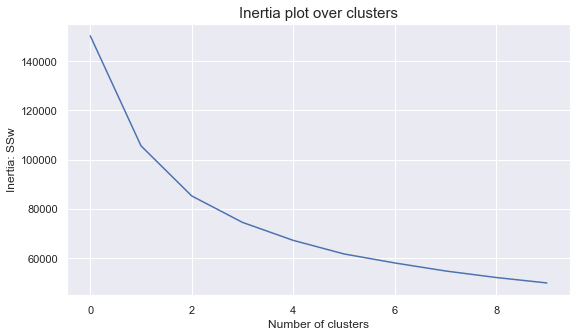

In [83]:
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

In [84]:
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.feature_selection import RFE
from sklearn.metrics import silhouette_score, silhouette_samples
import matplotlib.cm as cm

For n_clusters = 2, the average silhouette_score is : 0.3286517593406164
For n_clusters = 3, the average silhouette_score is : 0.24566730870092068
For n_clusters = 4, the average silhouette_score is : 0.2544670605228889
For n_clusters = 5, the average silhouette_score is : 0.2520791558710678
For n_clusters = 6, the average silhouette_score is : 0.2530868366377149
For n_clusters = 7, the average silhouette_score is : 0.19888683445210095
For n_clusters = 8, the average silhouette_score is : 0.19661577993911625
For n_clusters = 9, the average silhouette_score is : 0.19672974093075685
For n_clusters = 10, the average silhouette_score is : 0.19410107925701883


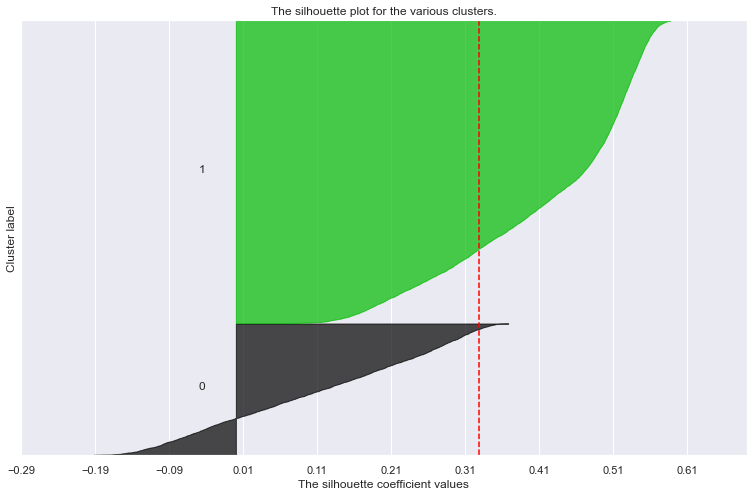

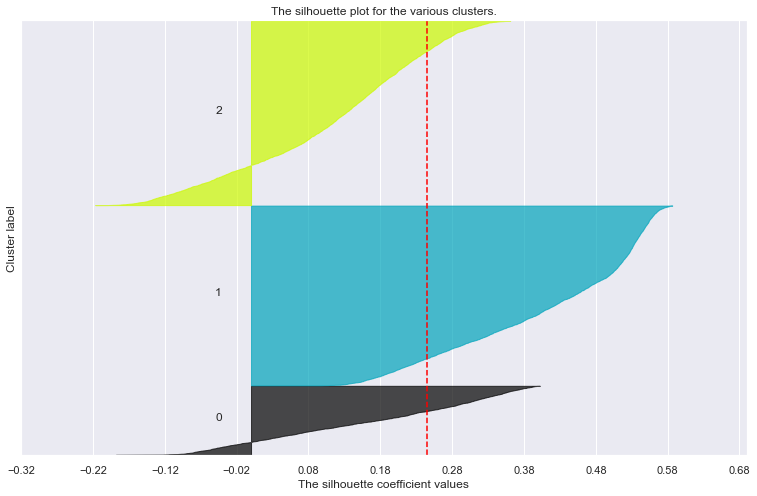

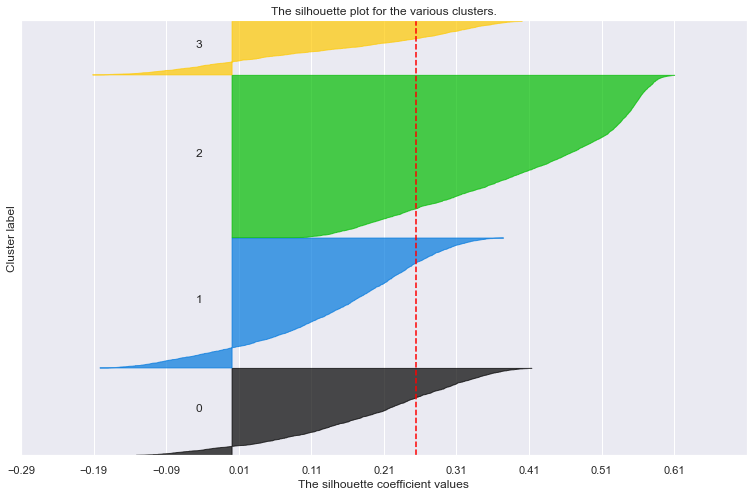

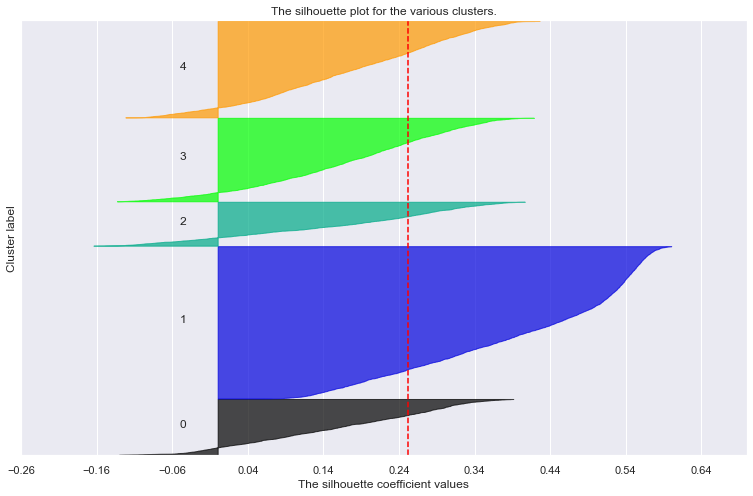

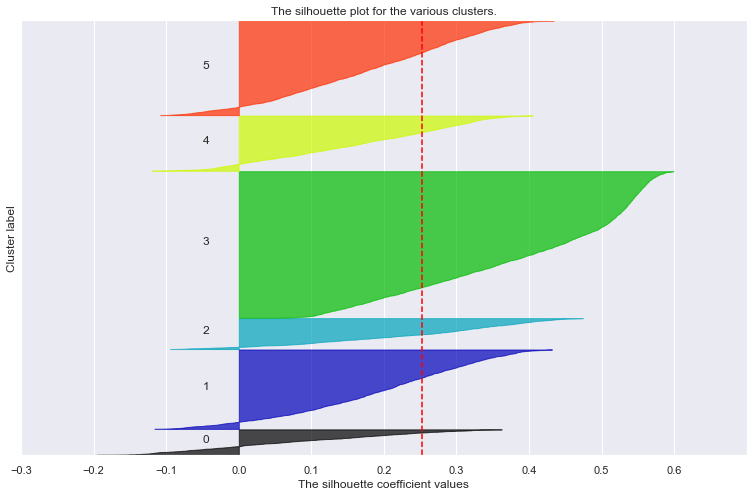

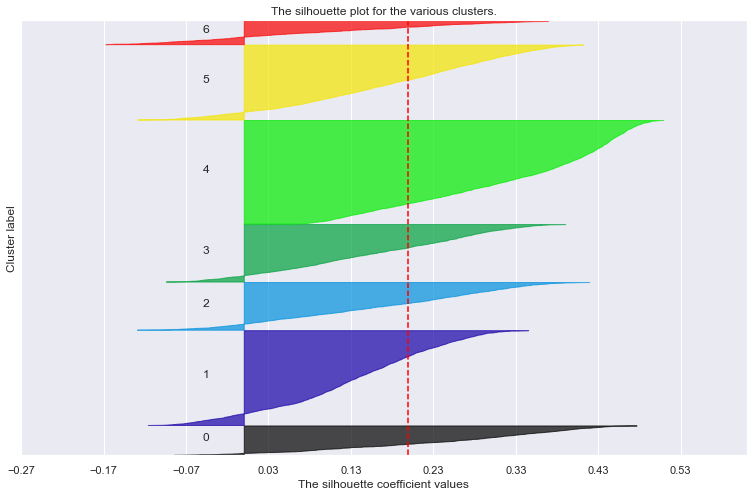

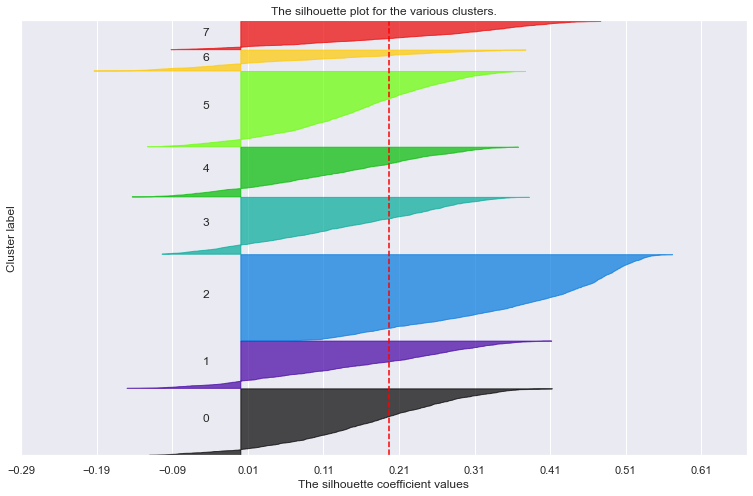

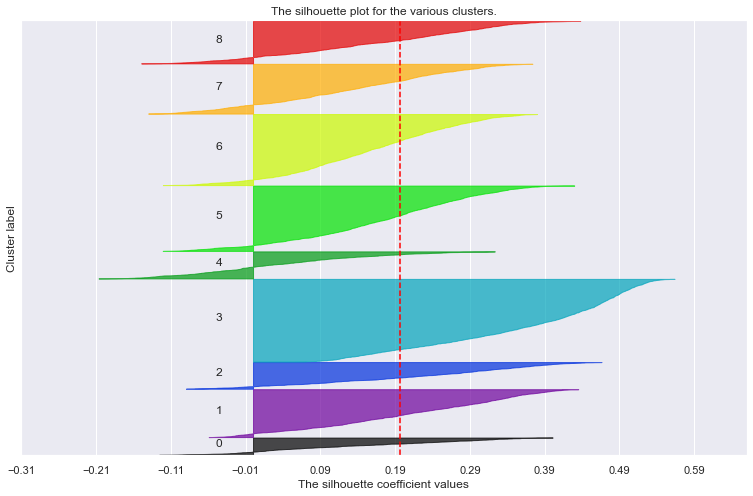

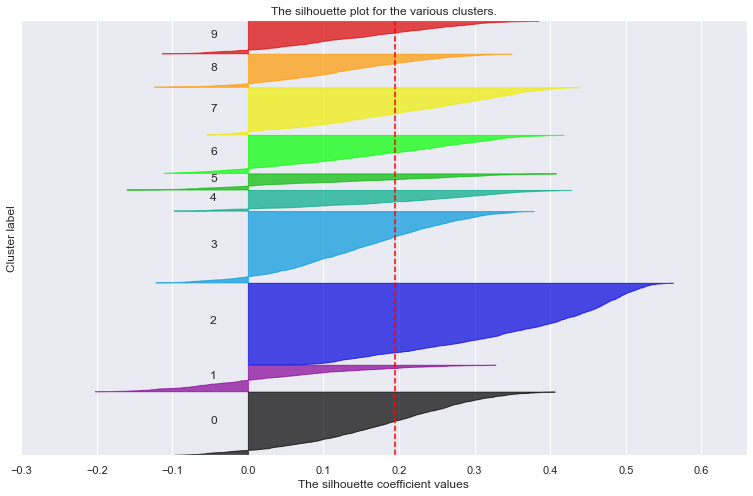

In [85]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 8))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df[metric_features])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df[metric_features], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df[metric_features], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df[metric_features]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

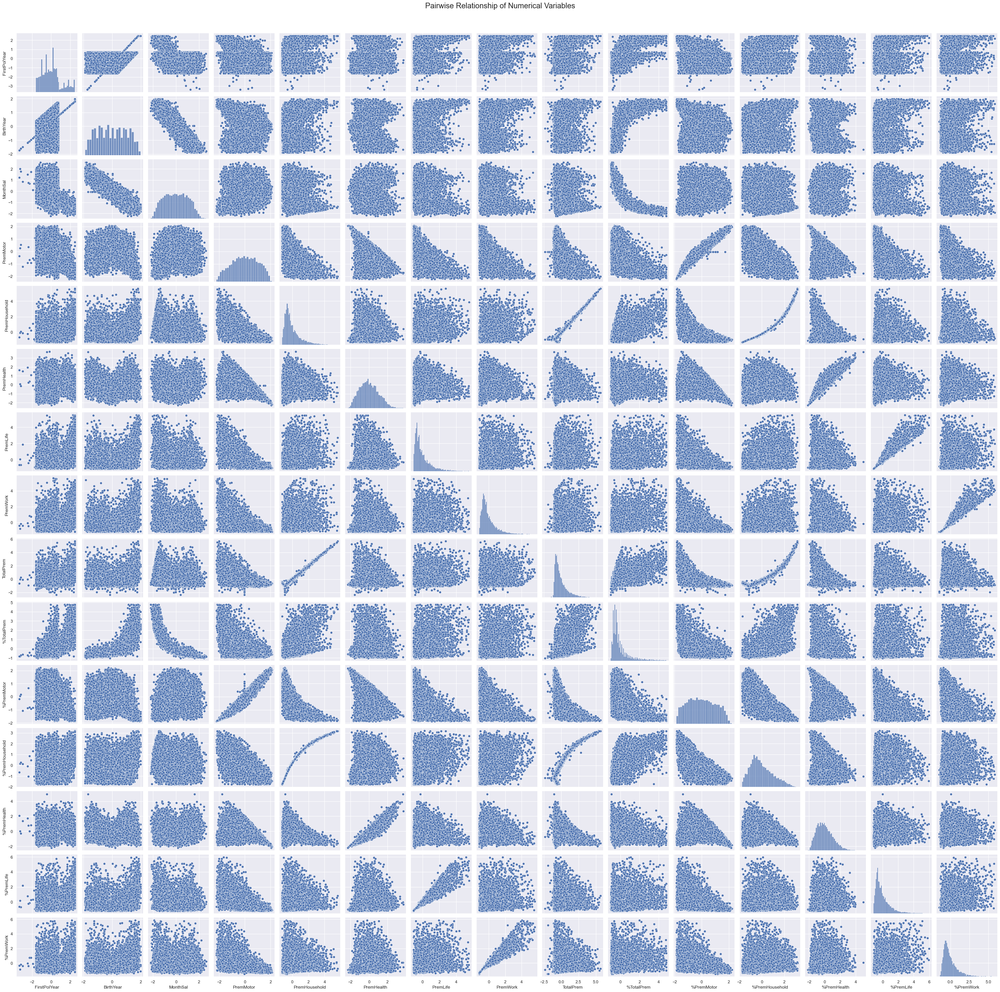

In [86]:
# Pairwise Relationship of Numerical Variables
sns.set()

# Setting pairplot
sns.pairplot(df[metric_features], diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)

plt.show()


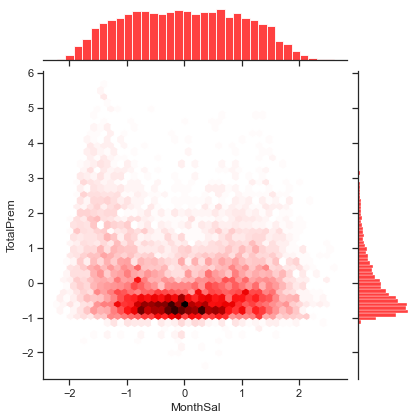

In [87]:
# Making the same visualization with customized formatting
sns.set(style="ticks")
sns.jointplot(data=df, x="MonthSal", y="TotalPrem", kind="hex", color="red")
plt.show()


<hr>
<a class="anchor" id="hierarchical">
    
## 6.2. Hierarchical Clustering
    
</a> <br>

Finding the best agglomerative hierarchical approach

In [88]:
hclust = AgglomerativeClustering(linkage='ward', affinity='euclidean', n_clusters=5)
hc_labels = hclust.fit_predict(df[metric_features])

In [89]:
# Computing SST
X = df[metric_features].values
sst = np.sum(np.square(X - X.mean(axis=0)), axis=0)

# Computing SSW
ssw_iter = []
for i in np.unique(hc_labels):
    X_k = X[hc_labels == i]
    ssw_iter.append(np.sum(np.square(X_k - X_k.mean(axis=0)), axis=0))
ssw = np.sum(ssw_iter, axis=0)

# Computing SSB
ssb_iter = []
for i in np.unique(hc_labels):
    X_k = X[hc_labels == i]
    ssb_iter.append(X_k.shape[0] * np.square(X_k.mean(axis=0) - X.mean(axis=0)))
ssb = np.sum(ssb_iter, axis=0)

# Verifying the formula
np.round(sst) == np.round((ssw + ssb))

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True])

In [90]:
def get_r2_hc(df, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    """This function computes the R2 for a set of cluster solutions given by the application of a hierarchical method.
    The R2 is a measure of the homogenity of a cluster solution. It is based on SSt = SSw + SSb and R2 = SSb/SSt. 
    
    Parameters:
    df (DataFrame): Dataset to apply clustering
    link_method (str): either "ward", "complete", "average", "single"
    max_nclus (int): maximum number of clusters to compare the methods
    min_nclus (int): minimum number of clusters to compare the methods. Defaults to 1.
    dist (str): distance to use to compute the clustering solution. Must be a valid distance. Defaults to "euclidean".
    
    Returns:
    ndarray: R2 values for the range of cluster solutions
    """
    def get_ss(df):
        ss = np.sum(df.var() * (df.count() - 1))
        return ss  # return sum of sum of squares of each df variable
    
    sst = get_ss(df)  # get total sum of squares
    
    r2 = []  # where we will store the R2 metrics for each cluster solution
    
    for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
        cluster = AgglomerativeClustering(n_clusters=i, affinity=dist, linkage=link_method)
        
        
        hclabels = cluster.fit_predict(df) #get cluster labels
        
        
        df_concat = pd.concat((df, pd.Series(hclabels, name='labels')), axis=1)  # concat df with labels
        
        
        ssw_labels = df_concat.groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
        
        
        ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
        
        
        r2.append(ssb / sst)  # save the R2 of the given cluster solution
        
    return np.array(r2)

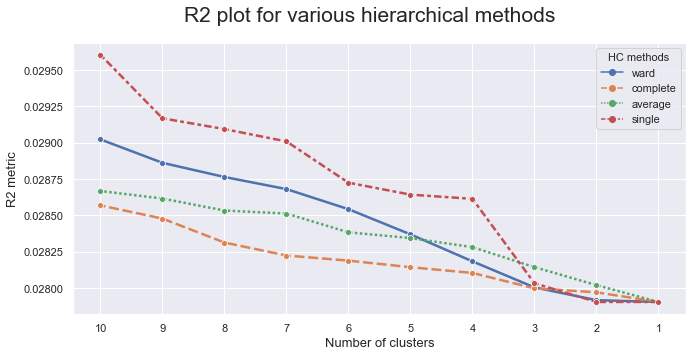

In [91]:
# Prepare input
hc_methods = ["ward", "complete", "average", "single"]
# Call function defined above to obtain the R2 statistic for each hc_method
max_nclus = 10
r2_hc_methods = np.vstack(
    [
        get_r2_hc(df=df[metric_features], link_method=link, max_nclus=max_nclus) 
        for link in hc_methods
    ]
).T
r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

sns.set()
# Plot data
fig = plt.figure(figsize=(11,5))
sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

# Finalize the plot
fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
plt.gca().invert_xaxis()  # invert x axis
plt.legend(title="HC methods", title_fontsize=11)
plt.xticks(range(1, max_nclus + 1))
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)

plt.show()

In [92]:
linkage = 'single'
clusters = 3
hc4lust = AgglomerativeClustering(linkage=linkage, affinity='euclidean', n_clusters=clusters)
hc4_labels = hc4lust.fit_predict(df[metric_features])

In [93]:
df_concat = pd.concat((df, pd.Series(hc4_labels, name='labels')), axis=1)
df_concat.groupby('labels').mean()

,FirstPolYear,BirthYear,MonthSal,Children,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,%TotalPrem,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD'
labels,,,,,,,,,,,,,,,,,,,,
0.0,0.000309,-0.001470,0.002106,0.705677,-0.001554,0.000898,0.001570,0.000273,0.001626,0.001033,-0.000968,-0.001949,0.001458,0.000664,0.000536,0.001768,0.110564,0.341238,0.47644,0.070013
1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2.0,0.137447,-0.025336,0.015870,1.000000,1.778306,-1.119010,-1.746814,-0.862828,-0.838305,-0.719623,-0.472026,1.806224,-1.527138,-1.568116,-0.901397,-0.858826,0.000000,0.000000,1.00000,0.000000


In [94]:
linkage = 'ward'
clusters = 5
hc4lust = AgglomerativeClustering(linkage=linkage, affinity='euclidean', n_clusters=clusters)
hc4_labels = hc4lust.fit_predict(df[metric_features])

In [95]:
df_concat = pd.concat((df, pd.Series(hc4_labels, name='labels')), axis=1)
df_concat.groupby('labels').mean()

,FirstPolYear,BirthYear,MonthSal,Children,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,%TotalPrem,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD'
labels,,,,,,,,,,,,,,,,,,,,
0.0,-0.009260,0.009929,-0.007466,0.702314,-0.010240,0.031912,0.011313,-0.019322,0.008460,0.033335,0.019106,-0.017599,0.032002,-0.003307,-0.027698,0.003732,0.111333,0.341580,0.476057,0.069433
1.0,-0.000338,-0.000260,-0.000714,0.717511,-0.005436,0.006274,-0.004432,0.003465,0.010031,0.004574,-0.005695,-0.002821,0.004365,-0.004827,-0.000047,0.010011,0.115363,0.338106,0.475220,0.069383
2.0,-0.032842,-0.035066,0.068000,0.685714,0.033725,-0.003238,-0.061669,-0.011774,0.035099,-0.002568,-0.046199,0.022909,0.004250,-0.062924,-0.010375,0.042438,0.081905,0.365714,0.455238,0.097143
3.0,0.000139,-0.003193,0.000855,0.706714,0.035560,-0.051214,-0.006882,-0.001994,-0.040061,-0.046080,-0.021023,0.035481,-0.048667,0.008836,0.011019,-0.034374,0.102473,0.337203,0.487128,0.071681
4.0,0.040575,-0.012340,0.004043,0.682149,-0.051101,0.007311,0.043084,0.043498,0.016673,0.001658,0.026230,-0.041115,0.009839,0.042126,0.052384,0.014996,0.121129,0.346084,0.472678,0.057377


<hr>
<a class="anchor" id="kmeans">
    
## 6.3. K-Means Clustering
    
</a> <br>

First lets see the elbow method

In [97]:
df_kmeans = df.copy()

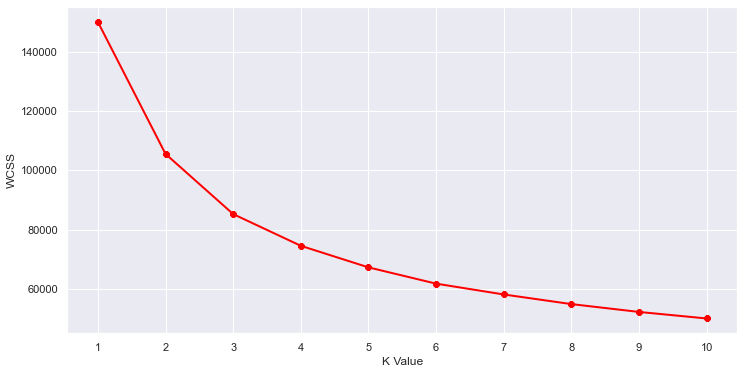

In [98]:
#Taking the features
X2=df_kmeans[metric_features]
#Now we calculate the Within Cluster Sum of Squared Errors (WSS) for different values of k.
wcss = []
for k in range(1,11):
    kmeans = KMeans(n_clusters=k, init="k-means++")
    kmeans.fit(X2)
    wcss.append(kmeans.inertia_)
plt.figure(figsize=(12,6))    
plt.plot(range(1,11),wcss, linewidth=2, color="red", marker ="8")
plt.xlabel("K Value")
plt.xticks(np.arange(1,11,1))
plt.ylabel("WCSS")
plt.show()

Lets try it out with 3 clusters

In [99]:
#Taking 3 clusters
km1=KMeans(n_clusters=3)
#Fitting the input data
km1.fit(X)
#predicting the labels of the input data
y=km1.predict(X)
#adding the labels to a column named label
df_kmeans["label"] = y
#The new dataframe with the clustering done
df_kmeans.head()

,FirstPolYear,BirthYear,MonthSal,Children,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,...,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD',label
CustID,,,,,,,,,,,,,,,,,,,,,
1.0,-0.545011,0.855465,-0.383189,1.0,0.542873,-0.537840,-0.301244,0.172044,-0.511844,-0.514315,...,0.539987,-0.526588,-0.097080,0.398753,-0.468669,0,1,0,0,1
2.0,2.184822,1.618825,-1.958420,1.0,-1.675984,1.034751,-0.701188,3.562682,1.585591,0.948172,...,-1.527339,1.253337,-0.953633,3.113774,1.326058,0,1,0,0,2
3.0,0.039953,0.150824,-0.278173,0.0,-0.719033,0.139530,-0.594833,1.076551,1.418483,-0.067106,...,-0.696102,0.442365,-0.581218,1.278267,1.657692,1,0,0,0,0
4.0,-0.057541,0.796745,-1.515255,1.0,-0.895045,-0.706424,1.920357,-0.096273,-0.242731,-0.900974,...,-0.584121,-0.774093,2.677406,0.169315,-0.039495,0,0,1,0,0
5.0,-0.447517,0.326984,-0.817953,1.0,0.266027,-0.685643,0.187128,-0.477022,0.065397,-0.730768,...,0.423700,-0.753028,0.554645,-0.385161,0.331155,0,0,1,0,1


In [100]:
df_kmeans['label'].value_counts()

0    4259
1    4158
2    1600
Name: label, dtype: int64

In [101]:
df_kmeans.groupby('label').mean()[metric_features] #MonthSal, %PremMotor

,FirstPolYear,BirthYear,MonthSal,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,%TotalPrem,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork
label,,,,,,,,,,,,,,,
0,-0.196628,-0.396324,0.388657,-0.467515,0.060282,0.675567,0.117379,0.126114,0.034972,-0.285451,-0.483951,0.164749,0.636650,0.189894,0.200783
1,-0.298790,-0.053509,0.035877,0.973635,-0.616582,-0.735916,-0.591945,-0.588454,-0.589453,-0.369189,0.992609,-0.687102,-0.507389,-0.557645,-0.552447
2,1.299881,1.194022,-1.127790,-1.285767,1.441880,0.114189,1.225868,1.193544,1.438748,1.719266,-1.291327,1.347063,-0.376105,0.943705,0.901212


In [102]:
X = df_kmeans.drop(columns=['label'])
y = df_kmeans.label
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

nof_list=np.arange(1,10)            
high_score=0
nof=0           
score_list =[]
for n in range(len(nof_list)):
    model = DecisionTreeClassifier(max_depth=3)
    rfe = RFE(estimator = model, n_features_to_select = nof_list[n])
    X_train_rfe = rfe.fit_transform(X_train[metric_features],y_train)
    X_val_rfe = rfe.transform(X_test[metric_features])
    model.fit(X_train_rfe,y_train)
    
    score = model.score(X_val_rfe,y_test)
    score_list.append(score)
    
    if(score>high_score):
        high_score = score
        nof = nof_list[n]
print("Optimum number of features: %d" %nof)
print("Score with %d features: %f" % (nof, high_score))

Optimum number of features: 3
Score with 3 features: 0.916667


In [103]:
model = DecisionTreeClassifier(max_depth=3)
rfe = RFE(estimator = model, n_features_to_select = nof)
X_rfe = rfe.fit_transform(X = X_train[metric_features], y = y_train)
selected_features = pd.Series(rfe.support_, index = X_train[metric_features].columns)
selected_features

FirstPolYear      False
BirthYear         False
MonthSal          False
PremMotor          True
PremHousehold     False
PremHealth        False
PremLife          False
PremWork          False
TotalPrem         False
%TotalPrem         True
%PremMotor         True
%PremHousehold    False
%PremHealth       False
%PremLife         False
%PremWork         False
dtype: bool

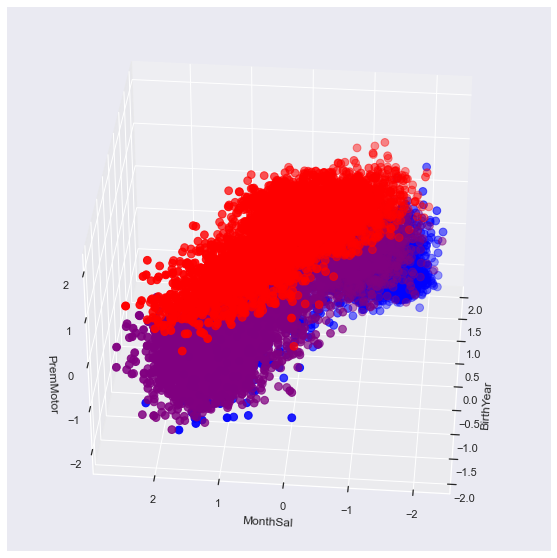

In [104]:
#3D Plot as we did the clustering on the basis of 3 input features
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df.BirthYear[df_kmeans.label == 0], df_kmeans["MonthSal"][df_kmeans.label == 0], df_kmeans["PremMotor"][df_kmeans.label == 0], c='purple', s=60)
ax.scatter(df.BirthYear[df_kmeans.label == 1], df_kmeans["MonthSal"][df_kmeans.label == 1], df_kmeans["PremMotor"][df_kmeans.label == 1], c='red', s=60)
ax.scatter(df.BirthYear[df_kmeans.label == 2], df_kmeans["MonthSal"][df_kmeans.label == 2], df_kmeans["PremMotor"][df_kmeans.label == 2], c='blue', s=60)
ax.view_init(35, 185)
plt.xlabel("BirthYear")
plt.ylabel("MonthSal")
ax.set_zlabel('PremMotor')
plt.show()

In [105]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable# Computing the R^2 of the cluster solution

In [106]:
sst = get_ss(df_kmeans[metric_features])  # get total sum of squares
#ssw_labels = df_concat.groupby(by='gmm_labels')  # compute ssw for each cluster labels
ssw_labels = get_ss(df_kmeans.groupby(by='label'))
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.3805


<hr>
<a class="anchor" id="selforganized">
    
## 6.4. Self-Organized Maps
    
</a> <br>

In [116]:
import sompy
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView

In [117]:
df_som = df.iloc[: , :-1].copy()

In [118]:
np.random.seed(42)

sm = sompy.SOMFactory().build(
    df_som[metric_features].values, 
    mapsize=[30, 30],
    initialization='random', 
    lattice='hexa',
    component_names=metric_features
)
sm.train(n_job=4, verbose='info', train_rough_len=100, train_finetune_len=100)

 Training...
 random_initialization took: 0.001000 seconds
 Rough training...
 radius_ini: 10.000000 , radius_final: 1.666667, trainlen: 100

 epoch: 1 ---> elapsed time:  0.282000, quantization error: 4.858134

 epoch: 2 ---> elapsed time:  0.295000, quantization error: 3.519543

 epoch: 3 ---> elapsed time:  0.397000, quantization error: 3.415266

 epoch: 4 ---> elapsed time:  0.274000, quantization error: 3.394435

 epoch: 5 ---> elapsed time:  0.697000, quantization error: 3.385339

 epoch: 6 ---> elapsed time:  0.257000, quantization error: 3.379805

 epoch: 7 ---> elapsed time:  0.273000, quantization error: 3.376440

 epoch: 8 ---> elapsed time:  0.278000, quantization error: 3.373132

 epoch: 9 ---> elapsed time:  0.265000, quantization error: 3.369805

 epoch: 10 ---> elapsed time:  0.268000, quantization error: 3.366395

 epoch: 11 ---> elapsed time:  0.154000, quantization error: 3.362789

 epoch: 12 ---> elapsed time:  0.155000, quantization error: 3.358756

 epoch: 13 --->

 epoch: 14 ---> elapsed time:  0.156000, quantization error: 2.087671

 epoch: 15 ---> elapsed time:  0.157000, quantization error: 2.080755

 epoch: 16 ---> elapsed time:  0.157000, quantization error: 2.073793

 epoch: 17 ---> elapsed time:  0.157000, quantization error: 2.066630

 epoch: 18 ---> elapsed time:  0.157000, quantization error: 2.059387

 epoch: 19 ---> elapsed time:  0.156000, quantization error: 2.052289

 epoch: 20 ---> elapsed time:  0.156000, quantization error: 2.045396

 epoch: 21 ---> elapsed time:  0.157000, quantization error: 2.038488

 epoch: 22 ---> elapsed time:  0.156000, quantization error: 2.031464

 epoch: 23 ---> elapsed time:  0.159000, quantization error: 2.024443

 epoch: 24 ---> elapsed time:  0.154000, quantization error: 2.017393

 epoch: 25 ---> elapsed time:  0.155000, quantization error: 2.010367

 epoch: 26 ---> elapsed time:  0.157000, quantization error: 2.003375

 epoch: 27 ---> elapsed time:  0.157000, quantization error: 1.996414

 epoch

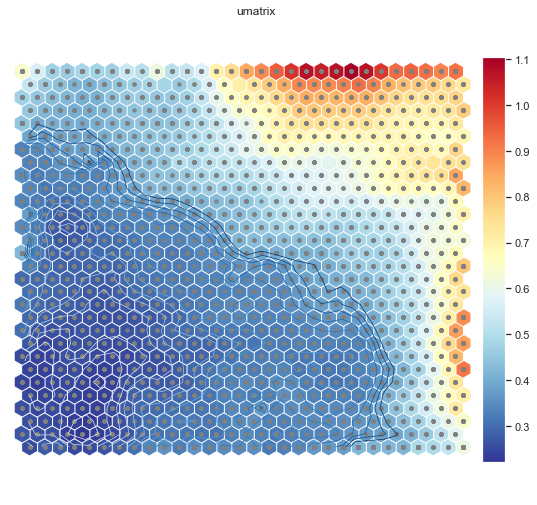

array([[0.9194129 , 0.89524481, 0.92376015, 0.94056671, 0.93195964,
        1.00523092, 1.07080066, 1.10550247, 1.07202005, 1.0500388 ,
        1.07407275, 1.01296206, 0.94854718, 0.88826576, 0.84352595,
        0.7539092 , 0.70097748, 0.56605203, 0.52944058, 0.5145602 ,
        0.60879148, 0.50963563, 0.53736252, 0.46888078, 0.47549328,
        0.48106998, 0.46079756, 0.4722837 , 0.55789166, 0.63924355],
       [0.7271156 , 0.76243122, 0.78867057, 0.7904309 , 0.8058144 ,
        0.83799398, 0.89754607, 0.92421681, 0.9000907 , 0.88809485,
        0.88860554, 0.89311286, 0.84121465, 0.79137926, 0.74288997,
        0.70889532, 0.65823084, 0.56460075, 0.49559083, 0.45525642,
        0.47801719, 0.48156621, 0.46623614, 0.45227557, 0.43474031,
        0.40983914, 0.41337055, 0.43800048, 0.4636608 , 0.53120669],
       [0.77145427, 0.75177337, 0.74778816, 0.74761745, 0.76807708,
        0.80345433, 0.83969351, 0.83613894, 0.82487919, 0.82580116,
        0.8406624 , 0.81211757, 0.76382981, 0.

In [119]:
# Here you have U-matrix
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm, 
    distance=2, 
    row_normalized=False,
    show_data=True, 
    contour=True, # Visualize isomorphic curves
    blob=False
)

UMAT[1]  

Hit-map <br>
Show the frequency of each Unit in the output map

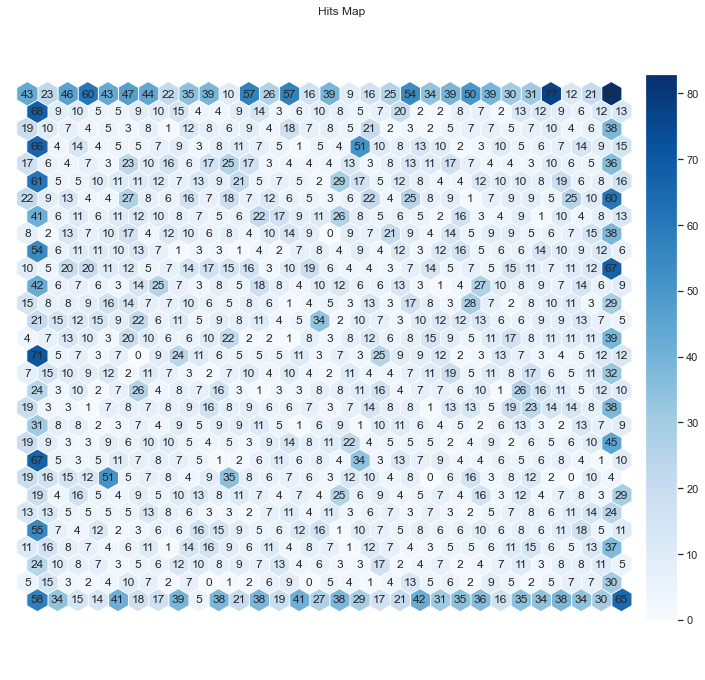

In [120]:
vhts  = BmuHitsView(12,12,"Hits Map")
vhts.show(sm, anotate=True, onlyzeros=False, labelsize=12, cmap="Blues")
plt.show()


<a class="anchor" id="hcsom">
    
### 6.4.1 Hierarchical Clustering with Self-Organized Maps
    
</a> <br>

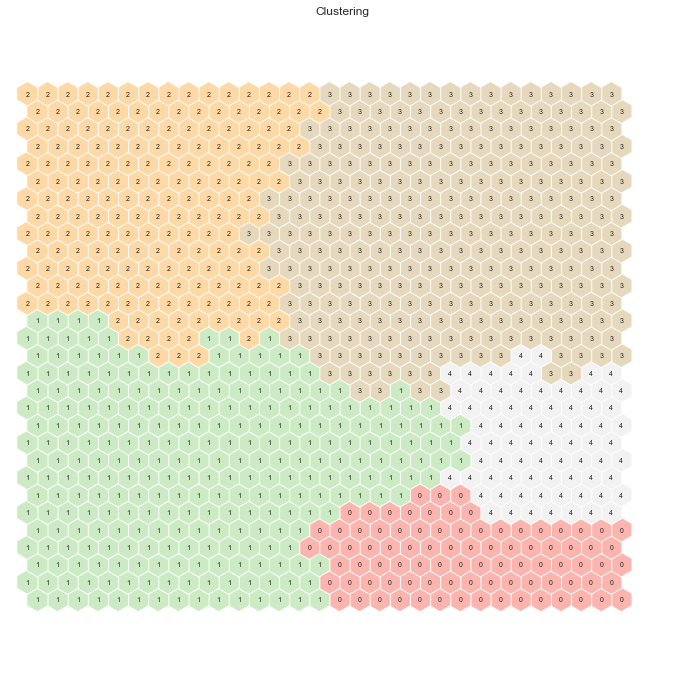

In [121]:
# Perform Hierarchical clustering on top of the 2500 untis (sm.get_node_vectors() output)
hierclust = AgglomerativeClustering(n_clusters=5, linkage='ward')
nodeclus_labels = hierclust.fit_predict(sm.codebook.matrix)
sm.cluster_labels = nodeclus_labels

hits  = HitMapView(12, 12,"Clustering",text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [122]:
nodes = sm.codebook.matrix

df_nodes = pd.DataFrame(nodes, columns=metric_features)
df_nodes['label'] = nodeclus_labels
df_nodes

,FirstPolYear,BirthYear,MonthSal,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,%TotalPrem,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork,label
0,1.938309,1.608031,-1.466398,-1.734442,2.591676,-0.447739,0.656727,3.016257,2.610631,3.002945,-1.630954,2.107756,-1.048502,0.164065,1.834819,0
1,1.979970,1.614161,-1.477049,-1.722758,2.623646,-0.369435,1.174552,2.278482,2.642497,3.066493,-1.627031,2.124367,-1.009574,0.517338,1.313787,0
2,1.926117,1.595495,-1.442018,-1.694939,2.941688,-0.369172,1.559934,1.490236,2.971231,3.127400,-1.624109,2.256352,-1.051370,0.716796,0.694182,0
3,1.907449,1.587861,-1.421856,-1.704624,2.947197,-0.303761,2.140188,0.797340,2.975377,3.084440,-1.624793,2.248111,-1.013960,1.119803,0.235206,0
4,1.886346,1.586873,-1.425261,-1.696144,2.515549,-0.316568,2.724613,0.634949,2.537269,2.875451,-1.602123,2.039614,-0.948485,1.684179,0.188426,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
895,-1.087047,-0.106331,0.139377,1.619564,-0.880827,-1.543254,-0.800237,-0.819389,-0.755392,-0.525914,1.698108,-1.105401,-1.334082,-0.814606,-0.837288,2
896,-1.005554,-0.029329,-0.016051,1.696795,-0.849156,-1.646093,-0.833065,-0.850206,-0.739588,-0.459917,1.754375,-1.049711,-1.451293,-0.858749,-0.878925,2
897,-0.793755,-0.027589,-0.084042,1.736493,-0.913947,-1.704821,-0.830305,-0.843465,-0.732370,-0.421881,1.783823,-1.162448,-1.517810,-0.855302,-0.870628,2
898,-0.488770,-0.074334,0.062212,1.742074,-0.930810,-1.715023,-0.831715,-0.855733,-0.735650,-0.486885,1.792456,-1.192005,-1.529177,-0.857230,-0.886410,2


In [123]:
bmus_map = sm.find_bmu(df_som[metric_features].values)[0]  # get bmus for each observation in df

df_bmus = pd.DataFrame(
    np.concatenate((df_som, np.expand_dims(bmus_map,1)), axis=1),
    index=df_som.index, columns=np.append(df_som.columns,"BMU")
)
df_bmus

,FirstPolYear,BirthYear,MonthSal,Children,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,...,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD',BMU
CustID,,,,,,,,,,,,,,,,,,,,,
1.0,-0.545011,0.855465,-0.383189,1.0,0.542873,-0.537840,-0.301244,0.172044,-0.511844,-0.514315,...,0.539987,-0.526588,-0.097080,0.398753,-0.468669,0.0,1.0,0.0,0.0,413.0
2.0,2.184822,1.618825,-1.958420,1.0,-1.675984,1.034751,-0.701188,3.562682,1.585591,0.948172,...,-1.527339,1.253337,-0.953633,3.113774,1.326058,0.0,1.0,0.0,0.0,6.0
3.0,0.039953,0.150824,-0.278173,0.0,-0.719033,0.139530,-0.594833,1.076551,1.418483,-0.067106,...,-0.696102,0.442365,-0.581218,1.278267,1.657692,1.0,0.0,0.0,0.0,190.0
4.0,-0.057541,0.796745,-1.515255,1.0,-0.895045,-0.706424,1.920357,-0.096273,-0.242731,-0.900974,...,-0.584121,-0.774093,2.677406,0.169315,-0.039495,0.0,0.0,1.0,0.0,28.0
5.0,-0.447517,0.326984,-0.817953,1.0,0.266027,-0.685643,0.187128,-0.477022,0.065397,-0.730768,...,0.423700,-0.753028,0.554645,-0.385161,0.331155,0.0,0.0,1.0,0.0,299.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10292.0,-0.642505,-1.082296,0.678517,0.0,0.675905,-0.677937,0.068776,-0.683950,-0.561436,-0.657346,...,0.751027,-0.747762,0.377748,-0.671959,-0.507684,0.0,0.0,0.0,1.0,884.0
10293.0,-1.324963,-0.906136,-0.116449,0.0,-1.258671,3.927991,-0.343166,-0.612445,1.562088,4.045021,...,-1.492883,2.659373,-1.214323,-0.786678,0.467710,1.0,0.0,0.0,0.0,270.0
10294.0,0.332435,0.503145,0.394976,1.0,0.749448,-0.288701,-0.356646,-0.617503,-0.793884,-0.331474,...,0.604591,-0.147433,-0.246045,-0.614599,-0.819811,0.0,0.0,1.0,0.0,384.0


In [124]:
# Get cluster labels for each observation
df_final = df_bmus.merge(df_nodes['label'], 'left', left_on="BMU", right_index=True)
df_final

,FirstPolYear,BirthYear,MonthSal,Children,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,...,%PremHousehold,%PremHealth,%PremLife,%PremWork,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD',BMU,label
CustID,,,,,,,,,,,,,,,,,,,,,
1.0,-0.545011,0.855465,-0.383189,1.0,0.542873,-0.537840,-0.301244,0.172044,-0.511844,-0.514315,...,-0.526588,-0.097080,0.398753,-0.468669,0.0,1.0,0.0,0.0,413.0,1
2.0,2.184822,1.618825,-1.958420,1.0,-1.675984,1.034751,-0.701188,3.562682,1.585591,0.948172,...,1.253337,-0.953633,3.113774,1.326058,0.0,1.0,0.0,0.0,6.0,0
3.0,0.039953,0.150824,-0.278173,0.0,-0.719033,0.139530,-0.594833,1.076551,1.418483,-0.067106,...,0.442365,-0.581218,1.278267,1.657692,1.0,0.0,0.0,0.0,190.0,0
4.0,-0.057541,0.796745,-1.515255,1.0,-0.895045,-0.706424,1.920357,-0.096273,-0.242731,-0.900974,...,-0.774093,2.677406,0.169315,-0.039495,0.0,0.0,1.0,0.0,28.0,1
5.0,-0.447517,0.326984,-0.817953,1.0,0.266027,-0.685643,0.187128,-0.477022,0.065397,-0.730768,...,-0.753028,0.554645,-0.385161,0.331155,0.0,0.0,1.0,0.0,299.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10292.0,-0.642505,-1.082296,0.678517,0.0,0.675905,-0.677937,0.068776,-0.683950,-0.561436,-0.657346,...,-0.747762,0.377748,-0.671959,-0.507684,0.0,0.0,0.0,1.0,884.0,3
10293.0,-1.324963,-0.906136,-0.116449,0.0,-1.258671,3.927991,-0.343166,-0.612445,1.562088,4.045021,...,2.659373,-1.214323,-0.786678,0.467710,1.0,0.0,0.0,0.0,270.0,4
10294.0,0.332435,0.503145,0.394976,1.0,0.749448,-0.288701,-0.356646,-0.617503,-0.793884,-0.331474,...,-0.147433,-0.246045,-0.614599,-0.819811,0.0,0.0,1.0,0.0,384.0,1


In [125]:
# Computing the R^2 of the cluster solution
sst = get_ss(df_final)  # get total sum of squares
ssw_labels = get_ss(df_final.groupby(by='label'))
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.7871


In [126]:
Counter(df_final['label'])

Counter({1: 2669, 0: 1027, 2: 2446, 3: 3114, 4: 761})

In [127]:
#df_best = df_final.copy()

<hr>
<a class="anchor" id="ksom">
    
### 6.4.2 K-means with Self-Organized Maps
    
</a> <br>

K-means representation in a self-organized map with 5 clusters

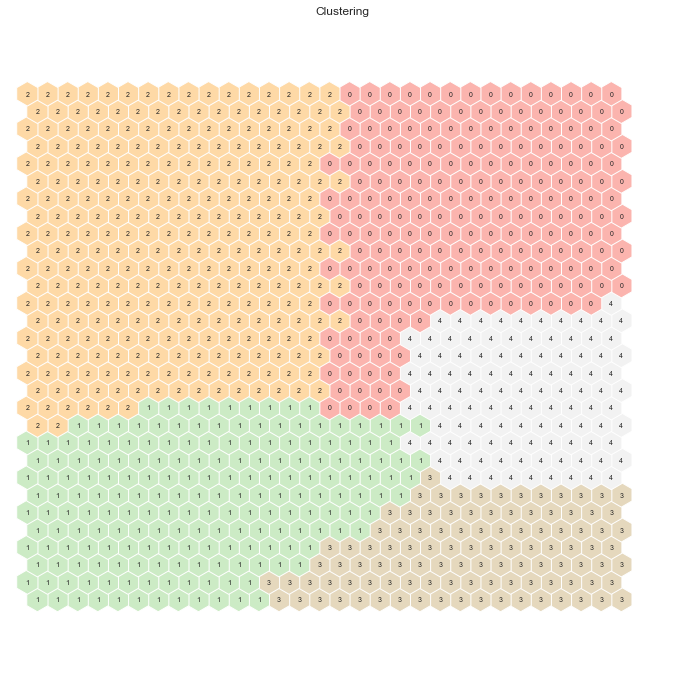

In [128]:
kmeans = KMeans(n_clusters=5, init='k-means++', n_init=20, random_state=42)
nodeclus_labels = kmeans.fit_predict(sm.codebook.matrix)
sm.cluster_labels = nodeclus_labels

hits  = HitMapView(12, 12,"Clustering", text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [129]:
nodes = sm.codebook.matrix

df_nodes = pd.DataFrame(nodes, columns=metric_features)
df_nodes['label'] = nodeclus_labels
df_nodes

,FirstPolYear,BirthYear,MonthSal,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,%TotalPrem,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork,label
0,1.938309,1.608031,-1.466398,-1.734442,2.591676,-0.447739,0.656727,3.016257,2.610631,3.002945,-1.630954,2.107756,-1.048502,0.164065,1.834819,3
1,1.979970,1.614161,-1.477049,-1.722758,2.623646,-0.369435,1.174552,2.278482,2.642497,3.066493,-1.627031,2.124367,-1.009574,0.517338,1.313787,3
2,1.926117,1.595495,-1.442018,-1.694939,2.941688,-0.369172,1.559934,1.490236,2.971231,3.127400,-1.624109,2.256352,-1.051370,0.716796,0.694182,3
3,1.907449,1.587861,-1.421856,-1.704624,2.947197,-0.303761,2.140188,0.797340,2.975377,3.084440,-1.624793,2.248111,-1.013960,1.119803,0.235206,3
4,1.886346,1.586873,-1.425261,-1.696144,2.515549,-0.316568,2.724613,0.634949,2.537269,2.875451,-1.602123,2.039614,-0.948485,1.684179,0.188426,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
895,-1.087047,-0.106331,0.139377,1.619564,-0.880827,-1.543254,-0.800237,-0.819389,-0.755392,-0.525914,1.698108,-1.105401,-1.334082,-0.814606,-0.837288,2
896,-1.005554,-0.029329,-0.016051,1.696795,-0.849156,-1.646093,-0.833065,-0.850206,-0.739588,-0.459917,1.754375,-1.049711,-1.451293,-0.858749,-0.878925,2
897,-0.793755,-0.027589,-0.084042,1.736493,-0.913947,-1.704821,-0.830305,-0.843465,-0.732370,-0.421881,1.783823,-1.162448,-1.517810,-0.855302,-0.870628,2
898,-0.488770,-0.074334,0.062212,1.742074,-0.930810,-1.715023,-0.831715,-0.855733,-0.735650,-0.486885,1.792456,-1.192005,-1.529177,-0.857230,-0.886410,2


In [130]:
bmus_map = sm.find_bmu(df_som[metric_features].values)[0]  # get bmus for each observation in df

df_bmus = pd.DataFrame(
    np.concatenate((df_som, np.expand_dims(bmus_map,1)), axis=1),
    index=df_som.index, columns=np.append(df_som.columns,"BMU")
)

In [131]:
# Get cluster labels for each observation
df_final = df_bmus.merge(df_nodes['label'], 'left', left_on="BMU", right_index=True)
df_final

,FirstPolYear,BirthYear,MonthSal,Children,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,...,%PremHousehold,%PremHealth,%PremLife,%PremWork,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD',BMU,label
CustID,,,,,,,,,,,,,,,,,,,,,
1.0,-0.545011,0.855465,-0.383189,1.0,0.542873,-0.537840,-0.301244,0.172044,-0.511844,-0.514315,...,-0.526588,-0.097080,0.398753,-0.468669,0.0,1.0,0.0,0.0,413.0,2
2.0,2.184822,1.618825,-1.958420,1.0,-1.675984,1.034751,-0.701188,3.562682,1.585591,0.948172,...,1.253337,-0.953633,3.113774,1.326058,0.0,1.0,0.0,0.0,6.0,3
3.0,0.039953,0.150824,-0.278173,0.0,-0.719033,0.139530,-0.594833,1.076551,1.418483,-0.067106,...,0.442365,-0.581218,1.278267,1.657692,1.0,0.0,0.0,0.0,190.0,3
4.0,-0.057541,0.796745,-1.515255,1.0,-0.895045,-0.706424,1.920357,-0.096273,-0.242731,-0.900974,...,-0.774093,2.677406,0.169315,-0.039495,0.0,0.0,1.0,0.0,28.0,1
5.0,-0.447517,0.326984,-0.817953,1.0,0.266027,-0.685643,0.187128,-0.477022,0.065397,-0.730768,...,-0.753028,0.554645,-0.385161,0.331155,0.0,0.0,1.0,0.0,299.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10292.0,-0.642505,-1.082296,0.678517,0.0,0.675905,-0.677937,0.068776,-0.683950,-0.561436,-0.657346,...,-0.747762,0.377748,-0.671959,-0.507684,0.0,0.0,0.0,1.0,884.0,2
10293.0,-1.324963,-0.906136,-0.116449,0.0,-1.258671,3.927991,-0.343166,-0.612445,1.562088,4.045021,...,2.659373,-1.214323,-0.786678,0.467710,1.0,0.0,0.0,0.0,270.0,4
10294.0,0.332435,0.503145,0.394976,1.0,0.749448,-0.288701,-0.356646,-0.617503,-0.793884,-0.331474,...,-0.147433,-0.246045,-0.614599,-0.819811,0.0,0.0,1.0,0.0,384.0,2


In [132]:
# Computing the R^2 of the cluster solution
sst = get_ss(df_final)  # get total sum of squares
ssw_labels = get_ss(df_final.groupby(by='label'))
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.7863


In [133]:
Counter(df_final['label'])

Counter({2: 3372, 3: 1248, 1: 1941, 0: 2428, 4: 1028})

In [134]:
df_final.groupby('label').mean()

,FirstPolYear,BirthYear,MonthSal,Children,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,...,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD',BMU
label,,,,,,,,,,,,,,,,,,,,,
0,-0.479640,-1.027156,0.980049,0.355848,-0.271844,-0.234655,0.581057,0.048139,0.022069,-0.265092,...,-0.244422,-0.147237,0.681209,0.182529,0.155407,0.071664,0.339786,0.525947,0.059308,701.248353
1,0.409788,0.887865,-0.865154,0.939207,-0.243590,-0.166550,0.691725,-0.177428,-0.089514,-0.193249,...,-0.233325,-0.073789,0.744925,-0.101752,-0.009384,0.074704,0.354972,0.507986,0.061824,175.124678
2,-0.349531,-0.086650,0.072714,0.876038,1.104025,-0.641421,-0.901538,-0.638822,-0.627754,-0.600657,...,1.118261,-0.726442,-0.683356,-0.616919,-0.604940,0.037367,0.236358,0.600830,0.123962,672.787663
3,1.570172,1.435043,-1.328466,0.770032,-1.422084,1.325047,0.166960,1.448753,1.405611,1.319046,...,-1.357602,1.217660,-0.263614,1.209769,1.152816,0.361378,0.452724,0.181891,0.002404,60.149840
4,-0.400572,-0.708327,0.693035,0.464008,-0.792963,1.364035,0.076045,0.557950,0.469597,1.359909,...,-1.002090,1.391673,-0.453898,0.315932,0.235437,0.202335,0.538911,0.246109,0.011673,367.804475


In [135]:
df_best = df_final.copy()

<hr>
<a class="anchor" id="dbscan2">
    
## 6.5. DBSCAN
    
</a> <br>

In [136]:
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=0.01, min_samples=3, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df[metric_features])

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 1


In [137]:
# Concatenating the labels to df
df_concat = pd.concat([df[metric_features], pd.Series(dbscan_labels, index=df.index, name="dbscan_labels")], axis=1)
df_concat.groupby('dbscan_labels').count()

,FirstPolYear,BirthYear,MonthSal,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,%TotalPrem,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork
dbscan_labels,,,,,,,,,,,,,,,
-1,10017,10017,10017,10017,10017,10017,10017,10017,10017,10017,10017,10017,10017,10017,10017


In [138]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

In [139]:
# Computing the R^2 of the cluster solution
df_nonoise = df_concat.loc[df_concat['dbscan_labels'] != -1]
sst = get_ss(df[metric_features])  # get total sum of squares
ssw_labels = get_ss(df_nonoise.groupby(by='dbscan_labels'))  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 1.0000


After analyzing the DBSCAN algorithm and its results, we conclude that its a bad model, due to the fact that the rows are classified all in the same cluster.

<hr>
<a class="anchor" id="gmm">
    
## 6.6. GMM
    
</a> <br>

In [140]:
from sklearn.mixture import GaussianMixture

In [141]:
# Performing GMM clustering
gmm = GaussianMixture(n_components=4, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gmm_labels = gmm.fit_predict(df[metric_features])
labels_proba = gmm.predict_proba(df[metric_features])

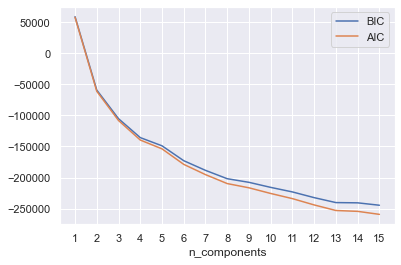

In [142]:
# Selecting number of components based on AIC and BIC
n_components = np.arange(1, 16)
models = [GaussianMixture(n, covariance_type='full', n_init=10, random_state=1).fit(df[metric_features])
          for n in n_components]

bic_values = [m.bic(df[metric_features]) for m in models]
aic_values = [m.aic(df[metric_features]) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

In [143]:
# Performing GMM clustering
gmm = GaussianMixture(n_components=5, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gmm_labels = gmm.fit_predict(df[metric_features])

In [144]:
# Concatenating the labels to df
df_gm = pd.concat([df[metric_features], pd.Series(gmm_labels, index=df.index, name="gmm_labels")], axis=1)
df_gm.head()

,FirstPolYear,BirthYear,MonthSal,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,%TotalPrem,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork,gmm_labels
CustID,,,,,,,,,,,,,,,,
1.0,-0.545011,0.855465,-0.383189,0.542873,-0.537840,-0.301244,0.172044,-0.511844,-0.514315,-0.271794,0.539987,-0.526588,-0.097080,0.398753,-0.468669,1
2.0,2.184822,1.618825,-1.958420,-1.675984,1.034751,-0.701188,3.562682,1.585591,0.948172,4.083259,-1.527339,1.253337,-0.953633,3.113774,1.326058,2
3.0,0.039953,0.150824,-0.278173,-0.719033,0.139530,-0.594833,1.076551,1.418483,-0.067106,-0.171678,-0.696102,0.442365,-0.581218,1.278267,1.657692,1
4.0,-0.057541,0.796745,-1.515255,-0.895045,-0.706424,1.920357,-0.096273,-0.242731,-0.900974,0.779426,-0.584121,-0.774093,2.677406,0.169315,-0.039495,4
5.0,-0.447517,0.326984,-0.817953,0.266027,-0.685643,0.187128,-0.477022,0.065397,-0.730768,-0.021503,0.423700,-0.753028,0.554645,-0.385161,0.331155,3


In [145]:
from collections import Counter
Counter(gmm_labels)

Counter({1: 3224, 2: 1290, 4: 1203, 3: 2572, 0: 1728})

In [146]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

In [147]:
# Computing the R^2 of the cluster solution
sst = get_ss(df_gm[metric_features])  # get total sum of squares
#ssw_labels = df_concat.groupby(by='gmm_labels')  # compute ssw for each cluster labels
ssw_labels = get_ss(df_gm.groupby(by='gmm_labels'))
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.4117


<hr>
<a class="anchor" id="msc">
    
## 6.7. Mean Shift Clustering
    
</a> <br>

In [148]:
from sklearn.cluster import MeanShift, DBSCAN, estimate_bandwidth

In [149]:
# The following bandwidth can be automatically detected using (we need to set quantile though)
# Based on distance to nearest neighbors for all observations
bandwidth = estimate_bandwidth(df[metric_features], quantile=0.03, random_state=1, n_jobs=-1) 
bandwidth

2.252417925611946

In [150]:
# Perform mean-shift clustering with bandwidth set using estimate_bandwidth
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=1)
ms_labels = ms.fit_predict(df[metric_features])

ms_n_clusters = len(np.unique(ms_labels))
print("Number of estimated clusters : %d" % ms_n_clusters)

Number of estimated clusters : 14


In [151]:
# Concatenating the labels to df
df_ms = pd.concat([df[metric_features], pd.Series(ms_labels, index=df.index, name="ms_labels")], axis=1)
df_ms.head()

,FirstPolYear,BirthYear,MonthSal,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,%TotalPrem,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork,ms_labels
CustID,,,,,,,,,,,,,,,,
1.0,-0.545011,0.855465,-0.383189,0.542873,-0.537840,-0.301244,0.172044,-0.511844,-0.514315,-0.271794,0.539987,-0.526588,-0.097080,0.398753,-0.468669,0
2.0,2.184822,1.618825,-1.958420,-1.675984,1.034751,-0.701188,3.562682,1.585591,0.948172,4.083259,-1.527339,1.253337,-0.953633,3.113774,1.326058,2
3.0,0.039953,0.150824,-0.278173,-0.719033,0.139530,-0.594833,1.076551,1.418483,-0.067106,-0.171678,-0.696102,0.442365,-0.581218,1.278267,1.657692,3
4.0,-0.057541,0.796745,-1.515255,-0.895045,-0.706424,1.920357,-0.096273,-0.242731,-0.900974,0.779426,-0.584121,-0.774093,2.677406,0.169315,-0.039495,11
5.0,-0.447517,0.326984,-0.817953,0.266027,-0.685643,0.187128,-0.477022,0.065397,-0.730768,-0.021503,0.423700,-0.753028,0.554645,-0.385161,0.331155,0


In [152]:
df_ms.groupby(by='ms_labels').mean()

,FirstPolYear,BirthYear,MonthSal,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,%TotalPrem,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork
ms_labels,,,,,,,,,,,,,,,
0,-0.297398,-0.219823,0.210164,0.518428,-0.387608,-0.237455,-0.397124,-0.437382,-0.381717,-0.380156,0.507756,-0.385318,-0.094394,-0.354413,-0.397461
1,0.999740,0.909549,-0.844213,-1.164703,1.827994,0.322012,0.732980,0.574165,1.834419,1.525892,-1.261475,1.658689,-0.362318,0.329900,0.216498
2,1.449029,1.292065,-1.131723,-1.357938,0.569126,0.105407,1.990821,1.516833,0.544838,1.182688,-1.245615,0.725183,-0.095820,1.892464,1.432949
3,-0.402179,-0.930021,0.940959,-0.884904,0.163435,0.671010,0.258109,1.213321,0.142072,-0.537078,-0.828437,0.262552,0.576619,0.334798,1.375259
4,2.054830,1.599252,-1.447937,-1.663131,-0.092535,-0.725138,2.660604,3.828428,-0.144810,1.374988,-1.391947,0.005013,-0.612014,3.187802,4.484336
5,0.710225,0.971681,-0.870854,-1.634362,-0.189154,-0.106613,3.430315,2.020295,-0.228499,0.575022,-1.368880,-0.102671,0.037532,4.098447,2.479868
6,1.707724,1.426423,-1.360346,-1.607240,-0.163135,1.003079,0.367134,3.042372,-0.184040,1.220363,-1.358544,-0.072139,1.072459,0.554560,3.597275
7,1.310161,1.335291,-1.186887,-1.703239,2.280278,-0.594180,0.140367,4.010052,2.291851,2.252563,-1.596557,1.928294,-1.067618,-0.160093,2.713069
8,2.351955,1.753042,-1.974623,-1.747891,-0.072584,-0.682856,4.230339,2.394945,-0.136221,3.132155,-1.492883,0.071485,-0.543977,4.859144,2.908984


In [153]:
from collections import Counter
Counter(ms_labels)

Counter({0: 6738,
         2: 340,
         3: 858,
         11: 418,
         1: 1216,
         5: 48,
         12: 171,
         10: 36,
         13: 15,
         7: 70,
         4: 39,
         6: 47,
         9: 14,
         8: 7})

In [154]:
# Computing the R^2 of the cluster solution
sst = get_ss(df_ms[metric_features])  # get total sum of squares
#ssw_labels = df_concat.groupby(by='ms_labels').apply(get_ss)  # compute ssw for each cluster labels
ssw_labels = get_ss(df_ms.groupby(by='ms_labels'))
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.4756


<hr>
<a class="anchor" id="clusterPersp">
    
## 6.8. Clustering by Perspectives
    
</a> <br>

In [155]:
social_features = ['BirthYear', 'MonthSal', 'Children', "EducDeg_b'1 - Basic'", "EducDeg_b'2 - High School'", "EducDeg_b'3 - BSc/MSc'","EducDeg_b'4 - PhD'"]
insurance_features = ['FirstPolYear','PremMotor','PremHousehold', 'PremHealth', 'PremLife', 'PremWork', 'TotalPrem', '%TotalPrem','%PremMotor', '%PremHousehold', '%PremHealth','%PremLife', '%PremWork']

df_soc = df[social_features].copy()
df_ins = df[insurance_features].copy()

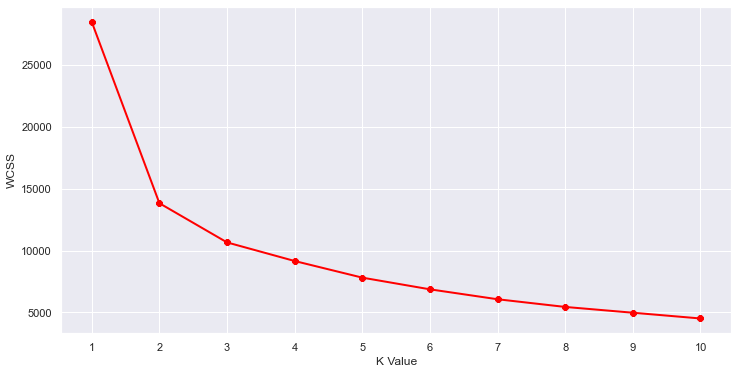

In [156]:
#Taking the features
X2=df[social_features]
#Now we calculate the Within Cluster Sum of Squared Errors (WSS) for different values of k.
wcss = []
for k in range(1,11):
    kmeans = KMeans(n_clusters=k, init="k-means++")
    kmeans.fit(X2)
    wcss.append(kmeans.inertia_)
plt.figure(figsize=(12,6))    
plt.plot(range(1,11),wcss, linewidth=2, color="red", marker ="8")
plt.xlabel("K Value")
plt.xticks(np.arange(1,11,1))
plt.ylabel("WCSS")
plt.show()

Lets try it out with 3 clusters

In [157]:
#Taking 3 clusters
km1=KMeans(n_clusters=4)
#Fitting the input data
km1.fit(X)
#predicting the labels of the input data
y=km1.predict(X)

#adding the labels to a column named label
df_soc["label"] = y
#The new dataframe with the clustering done
df_soc.head()

,BirthYear,MonthSal,Children,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD',label
CustID,,,,,,,,
1.0,0.855465,-0.383189,1.0,0,1,0,0,3
2.0,1.618825,-1.958420,1.0,0,1,0,0,0
3.0,0.150824,-0.278173,0.0,1,0,0,0,2
4.0,0.796745,-1.515255,1.0,0,0,1,0,1
5.0,0.326984,-0.817953,1.0,0,0,1,0,1


In [158]:
df_soc['label'].value_counts()

3    3755
2    3008
1    2015
0    1239
Name: label, dtype: int64

In [159]:
df_soc.groupby('label').mean()

,BirthYear,MonthSal,Children,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD'
label,,,,,,,
0,1.270581,-1.171654,0.741727,0.377724,0.455206,0.163842,0.002421
1,0.949825,-0.923887,0.934491,0.083871,0.373697,0.484864,0.056576
2,-1.010243,0.977607,0.354056,0.107713,0.405918,0.443484,0.039894
3,-0.119663,0.099246,0.855393,0.038083,0.237550,0.600533,0.122503


In [160]:
# Computing the R^2 of the cluster solution
sst = get_ss(df_soc)  # get total sum of squares
ssw_labels = get_ss(df_soc.groupby(by='label'))
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.6355


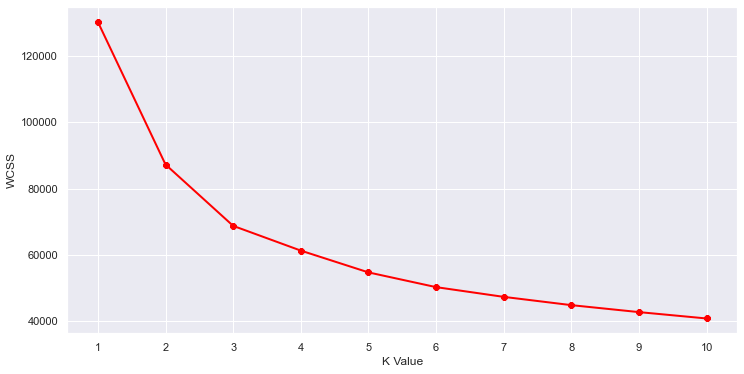

In [161]:
#Taking the features
X2=df_ins
#Now we calculate the Within Cluster Sum of Squared Errors (WSS) for different values of k.
wcss = []
for k in range(1,11):
    kmeans = KMeans(n_clusters=k, init="k-means++")
    kmeans.fit(X2)
    wcss.append(kmeans.inertia_)
plt.figure(figsize=(12,6))    
plt.plot(range(1,11),wcss, linewidth=2, color="red", marker ="8")
plt.xlabel("K Value")
plt.xticks(np.arange(1,11,1))
plt.ylabel("WCSS")
plt.show()

Lets try it out with 3 clusters

In [162]:
#Taking 3 clusters
km1=KMeans(n_clusters=4)
#Fitting the input data
km1.fit(X)
#predicting the labels of the input data
y=km1.predict(X)
#adding the labels to a column named label
df_ins["label"] = y
#The new dataframe with the clustering done
df_ins.head()

,FirstPolYear,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,%TotalPrem,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork,label
CustID,,,,,,,,,,,,,,
1.0,-0.545011,0.542873,-0.537840,-0.301244,0.172044,-0.511844,-0.514315,-0.271794,0.539987,-0.526588,-0.097080,0.398753,-0.468669,1
2.0,2.184822,-1.675984,1.034751,-0.701188,3.562682,1.585591,0.948172,4.083259,-1.527339,1.253337,-0.953633,3.113774,1.326058,2
3.0,0.039953,-0.719033,0.139530,-0.594833,1.076551,1.418483,-0.067106,-0.171678,-0.696102,0.442365,-0.581218,1.278267,1.657692,0
4.0,-0.057541,-0.895045,-0.706424,1.920357,-0.096273,-0.242731,-0.900974,0.779426,-0.584121,-0.774093,2.677406,0.169315,-0.039495,3
5.0,-0.447517,0.266027,-0.685643,0.187128,-0.477022,0.065397,-0.730768,-0.021503,0.423700,-0.753028,0.554645,-0.385161,0.331155,3


In [163]:
df_ins['label'].value_counts()

1    3755
0    3008
3    2015
2    1239
Name: label, dtype: int64

In [164]:
df_ins.groupby('label').mean()[insurance_features] 

,FirstPolYear,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,%TotalPrem,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork
label,,,,,,,,,,,,,
0,-0.463010,-0.465413,0.204794,0.521268,0.189048,0.179567,0.181645,-0.556849,-0.511923,0.306712,0.425108,0.230139,0.221384
1,-0.370352,1.036767,-0.633244,-0.819442,-0.609185,-0.609763,-0.600983,-0.421795,1.056318,-0.712527,-0.592309,-0.578300,-0.578536
2,1.401722,-1.399425,1.669274,-0.048080,1.441459,1.382947,1.669628,1.905833,-1.388888,1.510307,-0.573276,1.083180,1.011113
3,0.519440,-0.376780,-0.152069,0.778462,-0.033317,0.017891,-0.177850,0.445415,-0.350263,-0.058720,0.821679,0.068089,0.125911


In [165]:
# Computing the R^2 of the cluster solution
sst = get_ss(df_ins)  # get total sum of squares
ssw_labels = get_ss(df_ins.groupby(by='label'))
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.5231


In [166]:
from sklearn.base import clone
from sklearn.metrics import pairwise_distances

In [167]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

def r2(df, labels):
    sst = get_ss(df)
    #ssw = np.sum(df.groupby(labels).apply(get_ss))
    ssw = np.sum(get_ss(df.groupby(labels)))
    return 1 - ssw/sst
    
def get_r2_scores(df, clusterer, min_k=2, max_k=10):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
    return r2_clust


# Set up the clusterers
kmeans = KMeans(
    init='k-means++',
    n_init=20,
    random_state=42
)

hierarchical = AgglomerativeClustering(
    affinity='euclidean'
)

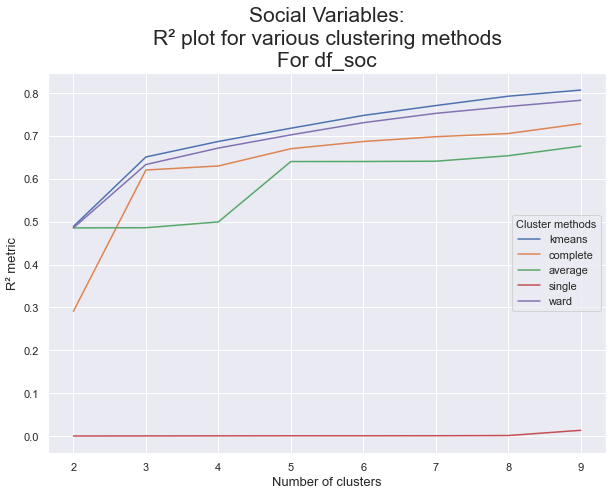

In [168]:
# Obtaining the R² scores for each cluster solution on demographic variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_soc, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_soc, hierarchical.set_params(linkage=linkage)
    )

pd.DataFrame(r2_scores)
# Visualizing the R² scores for each cluster solution on demographic variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Social Variables:\nR² plot for various clustering methods\n For df_soc ", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R² metric", fontsize=13)
plt.show()

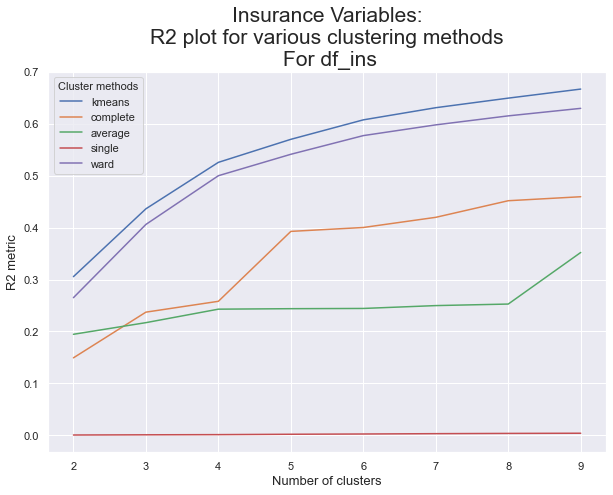

In [169]:
# Obtaining the R² scores for each cluster solution on product variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_ins, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_ins, hierarchical.set_params(linkage=linkage)
    )

# Visualizing the R² scores for each cluster solution on product variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Insurance Variables:\nR2 plot for various clustering methods\n For df_ins", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)
plt.show()

In [170]:
# Applying the right clustering (algorithm and number of clusters) for each perspective
kmeans_prod = KMeans(
    n_clusters=3,
    init='k-means++',
    n_init=20,
    random_state=42
)
insur_labels = kmeans_prod.fit_predict(df_ins)

kmeans_behav = KMeans(
    n_clusters=4,
    init='k-means++',
    n_init=20,
    random_state=42
)
social_labels = kmeans_behav.fit_predict(df_soc)

df['insur_labels'] = insur_labels
df['social_labels'] = social_labels

In [171]:
# Count label frequencies (contigency table)
df.groupby(['insur_labels', 'social_labels'])\
    .size()\
    .to_frame()\
    .reset_index()\
    .pivot('social_labels', 'insur_labels', 0)

insur_labels,0,1,2
social_labels,,,
0,11,98,1961
1,265,1622,469
2,1362,1738,99
3,114,792,1486


Now we merge 

In [172]:
# Clusters with low frequency to be merged:
to_merge = [(1,0), (0,1), (0,2), (3,2), (2,1), (2,2), (3,1)]

df_centroids = df.groupby(['social_labels', 'insur_labels'])\
    [metric_features].mean()

# Computing the euclidean distance matrix between the centroids
euclidean = pairwise_distances(df_centroids)
df_dists = pd.DataFrame(
    euclidean, columns=df_centroids.index, index=df_centroids.index
)

# Merging each low frequency clustering (source) to the closest cluster (target)
source_target = {}
for clus in to_merge:
    if clus not in source_target.values():
        source_target[clus] = df_dists.loc[clus].sort_values().index[1]

source_target

{(1, 0): (3, 0),
 (0, 1): (3, 1),
 (0, 2): (3, 2),
 (2, 1): (0, 1),
 (2, 2): (0, 2)}

In [173]:
df_ = df.copy()

# Changing the behavior_labels and product_labels based on source_target
for source, target in source_target.items():
    mask = (df_['social_labels']==source[0]) & (df_['insur_labels']==source[1])
    df_.loc[mask, 'social_labels'] = target[0]
    df_.loc[mask, 'insur_labels'] = target[1]

# New contigency table
df_.groupby(['insur_labels', 'social_labels'])\
    .size()\
    .to_frame()\
    .reset_index()\
    .pivot('social_labels', 'insur_labels', 0)

insur_labels,0,1,2
social_labels,,,
0,11.0,1738.0,99.0
1,NaN,1622.0,469.0
2,1362.0,NaN,NaN
3,379.0,890.0,3447.0


In [174]:
# Centroids of the concatenated cluster labels
df_centroids = df.groupby(['social_labels', 'insur_labels'])\
    [metric_features].mean()
df_centroids

FirstPolYear  BirthYear  MonthSal  PremMotor  \
social_labels insur_labels                                                 
0             0                -0.350023   0.364352 -0.171630  -0.574942   
              1                -0.698216   0.242500 -0.140003  -0.085776   
              2                -0.302742   0.332824 -0.400579   1.097048   
1             0                -0.326845  -1.170930  1.155177  -1.237258   
              1                -0.431829  -1.281771  1.241132  -0.564170   
              2                -0.442112  -1.319054  1.336608   0.677076   
2             0                 1.403581   1.329191 -1.238215  -1.332417   
              1                 0.452536   0.930132 -0.895009  -0.383162   
              2                 0.865206   1.105766 -1.165734   0.557892   
3             0                -0.450082  -0.483764  0.452025  -0.743954   
              1                -0.466843  -0.541064  0.487779  -0.247785   
              2                -0.472710  -0.488023  0.521242   1.006286   

                            PremHousehold  PremHealth  PremLife  PremWork  \
social_labels insur_labels                                                  
0             0                  1.086120   -0.439178  0.958769  0.468415   
              1                 -0.002195    0.075722  0.079928  0.025497   
              2                 -0.662677   -0.860453 -0.646753 -0.652428   
1             0                  1.867369    0.044781  1.112519  0.871166   
              1                  0.008772    0.915314  0.090277  0.083723   
              2                 -0.536164   -0.323769 -0.513027 -0.524454   
2             0                  1.506062    0.055640  1.300690  1.302829   
              1                 -0.204900    0.841948 -0.049784 -0.008186   
              2                 -0.498662   -0.186167 -0.468963 -0.452516   
3             0                  1.441844   -0.346973  0.676008  0.794033   
              1                  0.046959    0.231803  0.170798  0.181535   
              2                 -0.549916   -0.891379 -0.539474 -0.537449   

                            TotalPrem  %TotalPrem  %PremMotor  %PremHousehold  \
social_labels insur_labels                                                      
0             0              1.064606    0.110468   -0.839405        1.235145   
              1             -0.037993   -0.216628   -0.150484        0.094268   
              2             -0.616588   -0.221327    1.121508       -0.758442   
1             0              1.877322   -0.287850   -1.328489        1.685491   
              1             -0.020888   -0.674110   -0.548429        0.123159   
              2             -0.532481   -0.791160    0.693751       -0.570749   
2             0              1.504182    1.875631   -1.331712        1.404831   
              1             -0.232932    0.379883   -0.345416       -0.114433   
              2             -0.505579    0.515989    0.561739       -0.504247   
3             0              1.423412   -0.114594   -1.002536        1.455433   
              1              0.024244   -0.459701   -0.322726        0.169900   
              2             -0.530290   -0.601618    0.988786       -0.591730   

                            %PremHealth  %PremLife  %PremWork  
social_labels insur_labels                                     
0             0               -0.787739   0.727267   0.331155  
              1                0.097773   0.157414   0.101838  
              2               -0.633064  -0.626056  -0.632153  
1             0               -0.612592   0.733243   0.535289  
              1                0.877368   0.170859   0.166360  
              2               -0.080861  -0.467674  -0.481064  
2             0               -0.453006   0.996200   0.979026  
              1                0.916078   0.065762   0.113807  
              2                0.054331  -0.410268  -0.389455  
3             0               -0.796663   0.4

In [175]:
#pip install -U scikit-learn
from scipy.cluster.hierarchy import dendrogram, linkage

In [176]:
# Using Hierarchical clustering to merge the concatenated cluster centroids
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    distance_threshold=0,
    n_clusters=None
)
hclust_labels = hclust.fit_predict(df_centroids)

In [178]:
# Re-running the Hierarchical clustering based on the correct number of clusters
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    n_clusters=7
)
hclust_labels = hclust.fit_predict(df_centroids)
df_centroids['hclust_labels'] = hclust_labels

df_centroids  # centroid's cluster labels

FirstPolYear  BirthYear  MonthSal  PremMotor  \
social_labels insur_labels                                                 
0             0                -0.350023   0.364352 -0.171630  -0.574942   
              1                -0.698216   0.242500 -0.140003  -0.085776   
              2                -0.302742   0.332824 -0.400579   1.097048   
1             0                -0.326845  -1.170930  1.155177  -1.237258   
              1                -0.431829  -1.281771  1.241132  -0.564170   
              2                -0.442112  -1.319054  1.336608   0.677076   
2             0                 1.403581   1.329191 -1.238215  -1.332417   
              1                 0.452536   0.930132 -0.895009  -0.383162   
              2                 0.865206   1.105766 -1.165734   0.557892   
3             0                -0.450082  -0.483764  0.452025  -0.743954   
              1                -0.466843  -0.541064  0.487779  -0.247785   
              2                -0.472710  -0.488023  0.521242   1.006286   

                            PremHousehold  PremHealth  PremLife  PremWork  \
social_labels insur_labels                                                  
0             0                  1.086120   -0.439178  0.958769  0.468415   
              1                 -0.002195    0.075722  0.079928  0.025497   
              2                 -0.662677   -0.860453 -0.646753 -0.652428   
1             0                  1.867369    0.044781  1.112519  0.871166   
              1                  0.008772    0.915314  0.090277  0.083723   
              2                 -0.536164   -0.323769 -0.513027 -0.524454   
2             0                  1.506062    0.055640  1.300690  1.302829   
              1                 -0.204900    0.841948 -0.049784 -0.008186   
              2                 -0.498662   -0.186167 -0.468963 -0.452516   
3             0                  1.441844   -0.346973  0.676008  0.794033   
              1                  0.046959    0.231803  0.170798  0.181535   
              2                 -0.549916   -0.891379 -0.539474 -0.537449   

                            TotalPrem  %TotalPrem  %PremMotor  %PremHousehold  \
social_labels insur_labels                                                      
0             0              1.064606    0.110468   -0.839405        1.235145   
              1             -0.037993   -0.216628   -0.150484        0.094268   
              2             -0.616588   -0.221327    1.121508       -0.758442   
1             0              1.877322   -0.287850   -1.328489        1.685491   
              1             -0.020888   -0.674110   -0.548429        0.123159   
              2             -0.532481   -0.791160    0.693751       -0.570749   
2             0              1.504182    1.875631   -1.331712        1.404831   
              1             -0.232932    0.379883   -0.345416       -0.114433   
              2             -0.505579    0.515989    0.561739       -0.504247   
3             0              1.423412   -0.114594   -1.002536        1.455433   
              1              0.024244   -0.459701   -0.322726        0.169900   
              2             -0.530290   -0.601618    0.988786       -0.591730   

                            %PremHealth  %PremLife  %PremWork  hclust_labels  
social_labels insur_labels                                                    
0             0               -0.787739   0.727267   0.331155              2  
              1                0.097773   0.157414   0.101838              0  
              2               -0.633064  -0.626056  -0.632153              4  
1             0               -0.612592   0.733243   0.535289              6  
              1                0.877368   0.170859   0.166360              0  
              2               -0.080861  -0.467674  -0.481064              5  
2             0               -0.453006   0.996200   0.979026              3  
              1                0.91607

In [179]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_centroids['hclust_labels'].to_dict()

df_ = df.copy()

# Mapping the hierarchical clusters on the centroids to the observations
df_['merged_labels'] = df_.apply(
    lambda row: cluster_mapper[
        (row['social_labels'], row['insur_labels'])
    ], axis=1
)

# Merged cluster centroids
df_.groupby('merged_labels').mean()[metric_features]

,FirstPolYear,BirthYear,MonthSal,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,%TotalPrem,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork
merged_labels,,,,,,,,,,,,,,,
0,-0.453261,-0.988770,0.949728,-0.445755,0.020384,0.667057,0.115261,0.112290,-0.007326,-0.588662,-0.461743,0.136769,0.635559,0.202173,0.198421
1,0.474776,0.939597,-0.909599,-0.332446,-0.220731,0.786541,-0.072374,-0.032132,-0.247626,0.387218,-0.296528,-0.135441,0.869636,0.040108,0.086685
2,-0.441277,-0.409130,0.397143,-0.729081,1.410540,-0.355087,0.700891,0.765378,1.391837,-0.094788,-0.988180,1.436048,-0.795878,0.476609,0.563065
3,1.403581,1.329191,-1.238215,-1.332417,1.506062,0.055640,1.300690,1.302829,1.504182,1.875631,-1.331712,1.404831,-0.453006,0.996200,0.979026
4,-0.376016,-0.021043,-0.003182,1.057920,-0.614066,-0.873785,-0.600505,-0.602861,-0.579385,-0.385270,1.064292,-0.686573,-0.660663,-0.572355,-0.573752
5,-0.442112,-1.319054,1.336608,0.677076,-0.536164,-0.323769,-0.513027,-0.524454,-0.532481,-0.791160,0.693751,-0.570749,-0.080861,-0.467674,-0.481064
6,-0.326845,-1.170930,1.155177,-1.237258,1.867369,0.044781,1.112519,0.871166,1.877322,-0.287850,-1.328489,1.685491,-0.612592,0.733243,0.535289


In [180]:
#Merge cluster contigency table
# Getting size of each final cluster
df_counts = df_.groupby('merged_labels')\
    .size()\
    .to_frame()

# Getting the product and behavior labels
df_counts = df_counts\
    .rename({v:k for k, v in cluster_mapper.items()})\
    .reset_index()

df_counts['social_labels'] = df_counts['merged_labels'].apply(lambda x: x[0])
df_counts['insur_labels'] = df_counts['merged_labels'].apply(lambda x: x[1])
df_counts.pivot('social_labels', 'insur_labels', 0)

insur_labels,0,1,2
social_labels,,,
1,265.0,NaN,469.0
2,1362.0,NaN,1837.0
3,125.0,2512.0,3447.0


In [181]:
df = df_.copy()

In [182]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

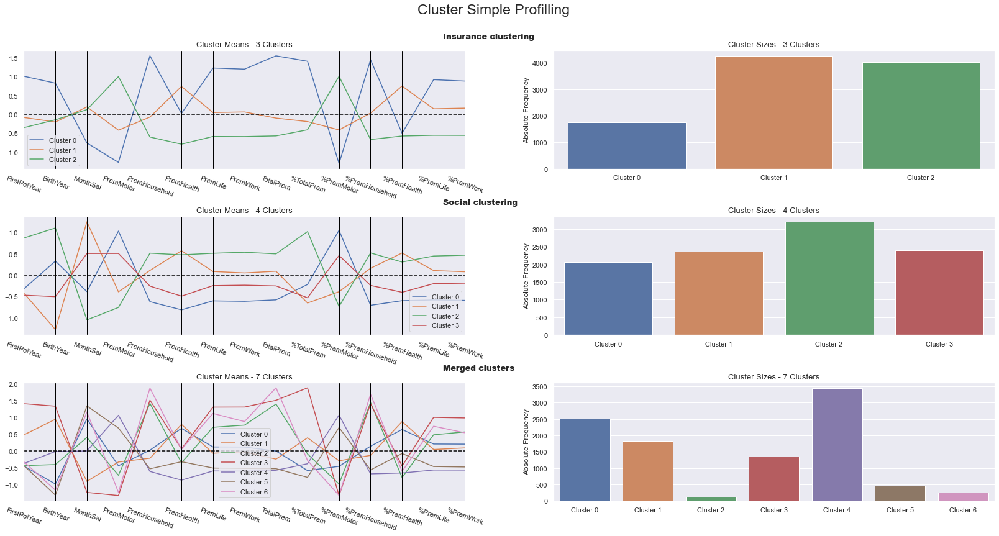

In [183]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(
    df = df_[metric_features + ['insur_labels', 'social_labels', 'merged_labels']], 
    label_columns = ['insur_labels', 'social_labels', 'merged_labels'], 
    figsize = (28, 13), 
    compar_titles = ["Insurance clustering", "Social clustering", "Merged clusters"]
)

### Cluster visualization using t-SNE

In [184]:
df_best

,FirstPolYear,BirthYear,MonthSal,Children,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,...,%PremHousehold,%PremHealth,%PremLife,%PremWork,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD',BMU,label
CustID,,,,,,,,,,,,,,,,,,,,,
1.0,-0.545011,0.855465,-0.383189,1.0,0.542873,-0.537840,-0.301244,0.172044,-0.511844,-0.514315,...,-0.526588,-0.097080,0.398753,-0.468669,0.0,1.0,0.0,0.0,413.0,2
2.0,2.184822,1.618825,-1.958420,1.0,-1.675984,1.034751,-0.701188,3.562682,1.585591,0.948172,...,1.253337,-0.953633,3.113774,1.326058,0.0,1.0,0.0,0.0,6.0,3
3.0,0.039953,0.150824,-0.278173,0.0,-0.719033,0.139530,-0.594833,1.076551,1.418483,-0.067106,...,0.442365,-0.581218,1.278267,1.657692,1.0,0.0,0.0,0.0,190.0,3
4.0,-0.057541,0.796745,-1.515255,1.0,-0.895045,-0.706424,1.920357,-0.096273,-0.242731,-0.900974,...,-0.774093,2.677406,0.169315,-0.039495,0.0,0.0,1.0,0.0,28.0,1
5.0,-0.447517,0.326984,-0.817953,1.0,0.266027,-0.685643,0.187128,-0.477022,0.065397,-0.730768,...,-0.753028,0.554645,-0.385161,0.331155,0.0,0.0,1.0,0.0,299.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10292.0,-0.642505,-1.082296,0.678517,0.0,0.675905,-0.677937,0.068776,-0.683950,-0.561436,-0.657346,...,-0.747762,0.377748,-0.671959,-0.507684,0.0,0.0,0.0,1.0,884.0,2
10293.0,-1.324963,-0.906136,-0.116449,0.0,-1.258671,3.927991,-0.343166,-0.612445,1.562088,4.045021,...,2.659373,-1.214323,-0.786678,0.467710,1.0,0.0,0.0,0.0,270.0,4
10294.0,0.332435,0.503145,0.394976,1.0,0.749448,-0.288701,-0.356646,-0.617503,-0.793884,-0.331474,...,-0.147433,-0.246045,-0.614599,-0.819811,0.0,0.0,1.0,0.0,384.0,2


In [185]:
df_best.shape

(10017, 22)

In [188]:
from sklearn.manifold import TSNE

In [189]:
# This is step can be quite time consuming
two_dim = TSNE(random_state=42).fit_transform(df_best[metric_features])

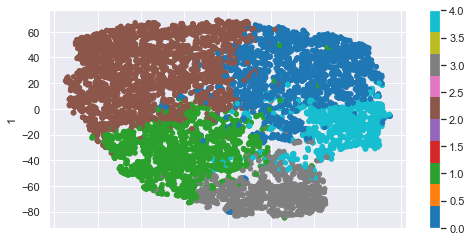

In [190]:
# t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=df_best['label'], colormap='tab10', figsize=(8,4))
plt.show()

### Using the R²
What proportion of each variables total SS is explained between clusters?

In [191]:
def get_ss_variables(df):
    """Get the SS for each variable
    """
    ss_vars = df.var() * (df.count() - 1)
    return ss_vars

def r2_variables(df, labels):
    """Get the R² for each variable
    """
    sst_vars = get_ss_variables(df)
    ssw_vars = np.sum(get_ss_variables(df.groupby(labels)))
    return 1 - ssw_vars/sst_vars

In [192]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(df_[metric_features + ['merged_labels']], 'merged_labels').drop('merged_labels')

%PremHealth       0.436225
%PremHousehold    0.554748
%PremLife         0.285510
%PremMotor        0.781921
%PremWork         0.277228
%TotalPrem        0.675422
BirthYear         0.767275
FirstPolYear      0.423784
MonthSal          0.707308
PremHealth        0.494726
PremHousehold     0.577743
PremLife          0.409610
PremMotor         0.765213
PremWork          0.399471
TotalPrem         0.565097
dtype: float64

In [193]:
df_

,FirstPolYear,BirthYear,MonthSal,Children,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,...,%PremLife,%PremWork,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD',label,insur_labels,social_labels,merged_labels
CustID,,,,,,,,,,,,,,,,,,,,,
1.0,-0.545011,0.855465,-0.383189,1.0,0.542873,-0.537840,-0.301244,0.172044,-0.511844,-0.514315,...,0.398753,-0.468669,0,1,0,0,44,2,0,4
2.0,2.184822,1.618825,-1.958420,1.0,-1.675984,1.034751,-0.701188,3.562682,1.585591,0.948172,...,3.113774,1.326058,0,1,0,0,29,0,2,3
3.0,0.039953,0.150824,-0.278173,0.0,-0.719033,0.139530,-0.594833,1.076551,1.418483,-0.067106,...,1.278267,1.657692,1,0,0,0,19,1,0,0
4.0,-0.057541,0.796745,-1.515255,1.0,-0.895045,-0.706424,1.920357,-0.096273,-0.242731,-0.900974,...,0.169315,-0.039495,0,0,1,0,45,1,2,1
5.0,-0.447517,0.326984,-0.817953,1.0,0.266027,-0.685643,0.187128,-0.477022,0.065397,-0.730768,...,-0.385161,0.331155,0,0,1,0,44,1,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10292.0,-0.642505,-1.082296,0.678517,0.0,0.675905,-0.677937,0.068776,-0.683950,-0.561436,-0.657346,...,-0.671959,-0.507684,0,0,0,1,14,2,1,5
10293.0,-1.324963,-0.906136,-0.116449,0.0,-1.258671,3.927991,-0.343166,-0.612445,1.562088,4.045021,...,-0.786678,0.467710,1,0,0,0,28,0,2,3
10294.0,0.332435,0.503145,0.394976,1.0,0.749448,-0.288701,-0.356646,-0.617503,-0.793884,-0.331474,...,-0.614599,-0.819811,0,0,1,0,36,2,0,4


In [194]:
# Computing the R^2 of the cluster solution
sst = get_ss(df_)  # get total sum of squares
ssw_labels = get_ss(df_.groupby(by='merged_labels'))
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.0813


### Using a Decision Tree
We get the normalized total reduction of the criterion (gini or entropy) brought by that feature (also known as Gini importance).

In [195]:
# Preparing the data
X = df.drop(columns=['social_labels','insur_labels','merged_labels'])
y = df.merged_labels

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Fitting the decision tree
dt = DecisionTreeClassifier(random_state=42, max_depth=3)
dt.fit(X_train, y_train)
print("It is estimated that in average, we are able to predict {0:.2f}% of the customers correctly".format(dt.score(X_test, y_test)*100))

It is estimated that in average, we are able to predict 85.23% of the customers correctly


In [196]:
# Assessing feature importance
pd.Series(dt.feature_importances_, index=X_train.columns)

FirstPolYear                  0.000000
BirthYear                     0.372688
MonthSal                      0.000000
Children                      0.007124
PremMotor                     0.424736
PremHousehold                 0.000000
PremHealth                    0.000000
PremLife                      0.000000
PremWork                      0.000000
TotalPrem                     0.000000
%TotalPrem                    0.015219
%PremMotor                    0.134475
%PremHousehold                0.045758
%PremHealth                   0.000000
%PremLife                     0.000000
%PremWork                     0.000000
EducDeg_b'1 - Basic'          0.000000
EducDeg_b'2 - High School'    0.000000
EducDeg_b'3 - BSc/MSc'        0.000000
EducDeg_b'4 - PhD'            0.000000
label                         0.000000
dtype: float64

<hr>
<a class="anchor" id="clusterAnalysis">
    
# 7. Cluster Analysis
    
</a>

Considering that the best cluster algorithm was Self organizing maps with hierarquical clustering

In [197]:
df_best.groupby('label').mean().round(2)

,FirstPolYear,BirthYear,MonthSal,Children,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,...,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD',BMU
label,,,,,,,,,,,,,,,,,,,,,
0,-0.48,-1.03,0.98,0.36,-0.27,-0.23,0.58,0.05,0.02,-0.27,...,-0.24,-0.15,0.68,0.18,0.16,0.07,0.34,0.53,0.06,701.25
1,0.41,0.89,-0.87,0.94,-0.24,-0.17,0.69,-0.18,-0.09,-0.19,...,-0.23,-0.07,0.74,-0.10,-0.01,0.07,0.35,0.51,0.06,175.12
2,-0.35,-0.09,0.07,0.88,1.10,-0.64,-0.90,-0.64,-0.63,-0.60,...,1.12,-0.73,-0.68,-0.62,-0.60,0.04,0.24,0.60,0.12,672.79
3,1.57,1.44,-1.33,0.77,-1.42,1.33,0.17,1.45,1.41,1.32,...,-1.36,1.22,-0.26,1.21,1.15,0.36,0.45,0.18,0.00,60.15
4,-0.40,-0.71,0.69,0.46,-0.79,1.36,0.08,0.56,0.47,1.36,...,-1.00,1.39,-0.45,0.32,0.24,0.20,0.54,0.25,0.01,367.80


<b>Cluster 0 - </b> The oldest custumers that have more investment power are the ones that invest less of their monthly salary in premiums. <br>
<b>Cluster 1 - </b> The ones that are starting a family with not that high of an income that value health the most.<br>
<b>Cluster 2 - </b> The ones that receive the average salary and that take into account motor very serious however not very serious their health. They are the ones that invest less in premiums.<br>
<b>Cluster 3 - </b> Newcomers to the insurance company as well as the youngest and so the monthly salary is the lowest one. When it comes to prem insurance categories they value all premiums the most except the motor.<br>
<b>Cluster 4 - </b> The ones that invest the most in premiums, specialy on household. Although this doesn't show on the % because they earn above the averege salary.<br>

To verify this, the data frame below shows that:

In [198]:
df_try = pd.concat([df_quantile, df_best['label']], axis = 1)

In [199]:
df_try.groupby('label').mean().round(2)

,FirstPolYear,BirthYear,MonthSal,Children,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,%TotalPrem,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD'
label,,,,,,,,,,,,,,,,,,,,
0,1985.67,1949.94,3475.13,0.36,266.29,144.37,211.81,41.62,39.61,707.38,1.74,38.29,19.10,30.36,5.97,5.70,0.07,0.34,0.53,0.06
1,1994.79,1982.55,1718.05,0.94,270.09,158.96,220.02,31.81,34.86,719.43,3.80,38.54,20.50,31.04,4.48,4.85,0.07,0.35,0.51,0.06
2,1987.01,1965.96,2611.13,0.88,451.31,57.27,101.83,11.74,11.96,651.07,2.22,69.93,8.10,15.70,1.79,1.80,0.04,0.24,0.60,0.12
3,2006.70,1991.87,1276.87,0.77,111.60,478.36,181.09,102.54,98.47,973.19,6.91,12.44,45.02,20.21,11.34,10.81,0.36,0.45,0.18,0.00
4,1986.48,1955.37,3201.82,0.46,196.21,486.71,174.35,63.79,58.65,980.05,2.69,20.70,48.33,18.17,6.67,6.11,0.20,0.54,0.25,0.01


Lets get a better understanding of the clusters, by visualizing them with a UMAP.

In [200]:
df_umap = df_best.copy()

In [201]:
df_umap.drop('BMU', axis=1, inplace=True)

In [202]:
#!pip install umap-learn[plot]
#!pip install holoviews
#!pip install -U ipykernel

In [203]:
import umap

In [204]:
mapper = umap.UMAP().fit(df_umap)

In [205]:
import umap.plot

<AxesSubplot:>

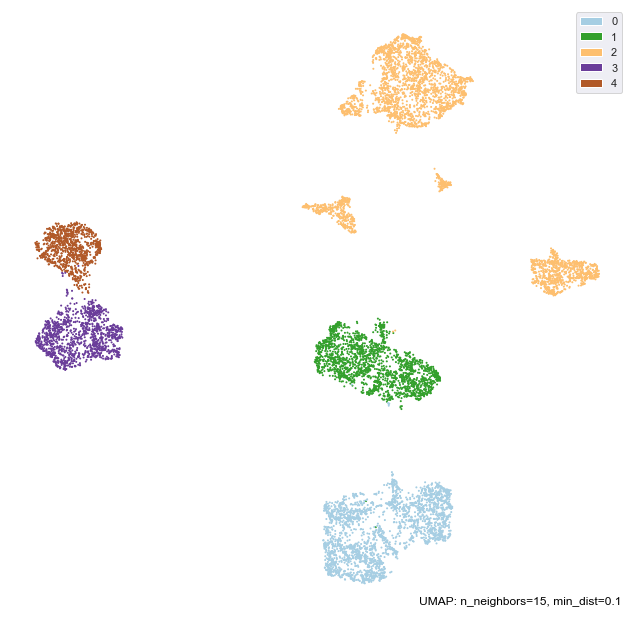

In [206]:
umap.plot.points(mapper, labels=df_umap.label, color_key_cmap='Paired')

<hr>
<a class="anchor" id="classificationOutlier">
    
# 8. Classification of Outliers
    
</a>

In [207]:
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.model_selection import train_test_split

In [208]:
X = df_best.drop(columns=['label','BMU'])
y = df_best['label']

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fitting the classification tree
dt = DecisionTreeClassifier(random_state=10, max_depth=5) 
dt.fit(X_train, y_train)
print("It is estimated that in average, we are able to predict {0:.2f}% of the customers correctly".format(dt.score(X_test, y_test)*100))

It is estimated that in average, we are able to predict 88.87% of the customers correctly


In [209]:
df_outliers.head()

,FirstPolYear,BirthYear,MonthSal,Children,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,%TotalPrem,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD'
CustID,,,,,,,,,,,,,,,,,,,,
109.0,2013.0,1995.0,764.0,1.0,79.68,912.95,97.24,213.04,16.56,1319.47,14.4,6.0,69.2,7.4,16.1,1.3,1,0,0,0
150.0,2012.0,1994.0,984.0,1.0,64.90,197.25,29.56,18.56,451.53,761.80,6.5,8.5,25.9,3.9,2.4,59.3,1,0,0,0
246.0,2011.0,1993.0,566.0,1.0,32.23,422.30,302.50,101.24,73.46,931.73,13.7,3.5,45.3,32.5,10.9,7.9,1,0,0,0
258.0,2013.0,1995.0,380.0,0.0,50.90,1012.40,221.93,10.78,128.80,1424.81,31.2,3.6,71.1,15.6,0.8,9.0,0,0,1,0
398.0,2016.0,2000.0,415.0,1.0,52.01,348.40,49.01,193.48,225.82,868.72,17.4,6.0,40.1,5.6,22.3,26.0,1,0,0,0


Now we will normalize the outliers and classificate them.

In [210]:
scaled_outliers = scalerS.fit_transform(df_outliers[metric_features])
df_outliers[metric_features] = scaled_outliers
#df_outliers = df_outliers.iloc[:,:-1]
df_outliers.head()

,FirstPolYear,BirthYear,MonthSal,Children,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,%TotalPrem,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD'
CustID,,,,,,,,,,,,,,,,,,,,
109.0,0.359339,0.247836,-0.123017,1.0,-0.135584,0.083501,-0.101283,1.026436,-0.730856,-0.077182,-0.099046,-0.266506,0.727492,-0.647721,0.293066,-0.866198,1,0,0,0
150.0,0.250366,0.163305,-0.066326,1.0,-0.150402,-0.359505,-0.140227,-1.100239,2.072330,-0.295417,-0.580747,-0.091635,-0.934279,-0.970244,-0.830040,3.490910,1,0,0,0
246.0,0.141392,0.078774,-0.174038,1.0,-0.183158,-0.220203,0.016829,-0.196118,-0.364161,-0.228917,-0.141728,-0.441377,-0.189745,1.665229,-0.133222,-0.370389,1,0,0,0
258.0,0.359339,0.247836,-0.221967,0.0,-0.164439,0.145059,-0.029533,-1.185315,-0.007520,-0.035959,0.925331,-0.434382,0.800410,0.107904,-0.961206,-0.287754,0,0,1,0
398.0,0.686259,0.670491,-0.212948,1.0,-0.163326,-0.265946,-0.129035,0.812544,0.617731,-0.253575,0.083879,-0.266506,-0.389311,-0.813590,0.801333,0.989329,1,0,0,0


In [211]:
df_outliers['label'] = dt.predict(df_outliers)

In [212]:
df_outliers['label'].value_counts()

1    229
0     40
2      6
4      4
Name: label, dtype: int64